<center> <img src="https://media.springernature.com/lw685/springer-static/image/chp%3A10.1007%2F978-3-030-39364-9_5/MediaObjects/489541_1_En_5_Fig3_HTML.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 2: Neighborhood Processing, Low-level Filters & Applications in image processing</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 19, 2025 (Amsterdam time)</font> 
</center>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 14646161  \
Student1 Name: Nora Kahleogullari

Student2 ID: 16322495\
Student2 Name: Ozan Ilhan

Student3 ID: \
Student3 Name: 

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [35]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [36]:
# environment and libraries
import os
import math
import numpy as np
import time
import cv2
import matplotlib
import matplotlib.pyplot as plt
import sklearn
import scipy.signal
import pandas as pd
from tqdm import tqdm

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

In [37]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 2 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=CV1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Neighborhood Processing for Image Processing (3 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (1 points)](#question-2)
- [Section 2: Low-Level Gaussian Filters (11 points)](#section-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (3 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
  - [Question 6 (2 points)](#question-6)
  - [Question 7 (1 point)](#question-7)
  - [Question 8 (2 points)](#question-8)
- [Section 3: Low-Level Gabors Filters (15 points)](#section-3)
  - [Question 9 (6 points)](#question-9)
  - [Question 10 (1 point)](#question-10)
  - [Question 11 (1 point)](#question-11)
  - [Question 12 (1 point)](#question-12)
  - [Question 13 (6 points)](#question-13)
- [Section 4: Noise in digital images (27 points)](#section-4)
  - [Question 14 (2 points)](#question-14)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (1 point)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (3 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 7 (2 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (2 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (3 points)](#question-24)
  - [Question 25 (2 points)](#question-24)
- [Section 5: Edge Detection (20 points)](#section-5)
  - [Question 26 (4 points)](#question-26)
  - [Question 27 (3 points)](#question-27)
  - [Question 28 (4 point)](#question-28)
  - [Question 29 (1 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (2 points)](#question-31)
  - [Question 32 (2 points)](#question-32)
  - [Question 33 (2 points)](#question-33)
- [Section 6: Foreground-background separation (24 points)](#section-6)
  - [Question 33 (8 points)](#question-33)
  - [Question 34 (8 points)](#question-34)
  - [Question 35 (4 points)](#question-35)
  - [Question 36 (4 points)](#question-36)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Neighborhood Processing for Image Processing**

This assignment will start with an exploration of neighborhood processing techniques, which are fundamental to image processing. These techniques allow for the extraction of structural patterns such as edges and blobs, and are extensively used in tasks like image denoising and segmentation. Neighborhood or block processing is also a key component of Convolutional Neural Networks.

Neighborhood processing involves examining the pixels surrounding a point $I(x, y)$ in an image $I$ and applying a function, $h(k, l)$, that measures specific properties or relationships within that local window. This function, $h(k, l)$, is known as the neighborhood operator or local operator, and is often implemented as a linear filter.

Linear filters compute a weighted sum of the neighboring pixel intensities and assign this sum to the pixel of interest, producing the output $I_{out}(i, j)$. These filters are typically represented as square matrices. Terms like filters, kernels, weight matrices, or masks are often used interchangeably in the literature. A kernel is a matrix that defines a neighborhood operation, such as edge detection or smoothing.

Linear filters are applied across the entire image using operators like correlation ($\otimes$) and convolution ($\ast$).\

Both operators are *linear shift-invariant* (LSI), meaning they function consistently across the image. The discrete forms of these operators are expressed as follows:

- **Correlation (1)**:

$\mathbf{I}_{out} = I \otimes  \mathbf{h} \\
\mathbf{I}_{out}(i,j) = \sum_{k,l}  \mathbf{I}(i+k,j+l) \mathbf{h}(k,l)$

- **Convolution (2)**:

$\mathbf{I}_{out} = \mathbf{I} \ast  \mathbf{h} \\
\mathbf{I}_{out}(i,j) = \sum_{k,l} \mathbf{I}(i-k,j-l) \mathbf{h}(k,l)$

The following example illustrates neighborhood processing: a kernel or mask convolves over the input image, with each pixel intensity multiplied by the corresponding weight in the kernel. The example uses a $3x3$ averaging mask, showing the effect of filtering on the input image.

<div>
<img src="https://assets.8thlight.com/images/insights/posts/2022-03-25-what-is-a-convolution/padding_example.png" width="700"/>
</div>

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

What is the difference between correlation and convolution operators? How do they treat the signals $\mathbf{I}$ and $\mathbf{h}$?

##### <font color='yellow'>Answer:</font>

>*With correlation the kernel h is used as is, and h is a pattern detector and it measures the similarity between I and H. With convolution the kernel is flipped so H becomes a filter operator *

University of Amsterdam. (2025). CV1_2025_HC2b – Neighborhood Processing – Image filtering [Lecture slides]. 2025/26 Semester 1, Computer Vision 1.

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (1 point)</font>

Correlation and convolution operators are equivalent when we make an assumption on the form of the mask $\mathbf{h}$. Can you identify the case? Give precise answer here.

##### <font color='yellow'>Answer:</font>

>*When the kernel h is symmetric, so than flipping the kernel does not change the output values*

University of Amsterdam. (2025). CV1_2025_HC2b – Neighborhood Processing – Image filtering [Lecture slides]. 2025/26 Semester 1, Computer Vision 1.

<a id="section-2"></a>
### **Section 2: Low-Level Gaussian Filters**

In this section, you will design common linear filters used in neighborhood processing. We will focus in on Gaussian filters, which are widely used for image smoothing and noise reduction.

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

The 1D Gaussian filter is defined as follows:

$G_{\sigma}(x)=\frac{1}{\sigma\sqrt{2\pi}}\text{ exp}(-\frac{x^2}{2\sigma^2})$

where $\sigma$ is the standard deviation of the Gaussian. However, such a formulation creates an infinitely large convolution kernel. In practice, the kernel is truncated with a `kernel_size` parameter such that $-\left\lfloor \frac{kernel\_size}{2}\right\rfloor \leq x \leq \left\lfloor \frac{kernel\_size}{2} \right\rfloor$, where $\left\lfloor \cdot \right\rfloor$ is the floor operator. For example, if `kernel_size` equals 3, then $x \in \{ -1, 0, 1 \}$.

Now, implement the following function `gaussian_kernel_1D`.

**Hint:** Do not forget to normalize your filter.

**Note:** You are not allowed to use any Python built-in functions provided by *SciPy* or other libraries to compute the kernel.

In [38]:
def gaussian_kernel_1D(sigma, kernel_size):
    '''
    Computes a 1D Gaussian kernel.

    Args:
        sigma: Standard deviation of the Gaussian distribution.
        kernel_size: The size of the kernel, must be an odd positive integer.

    Returns:
        kernel: A 1D numpy array representing the Gaussian kernel, normalized so that the sum of all elements equals 1.
    '''

    kernel = np.zeros((1, kernel_size))

    if kernel_size % 2 == 0:
        raise ValueError("The kernel size must be an odd number. Otherwise, the kernel will not have a center to convolve around.")

    # YOUR CODE HERE

    k = kernel_size/2
    x = np.arange(-k,k+1)

    kernel = (1 / (sigma * np.sqrt(2*np.pi))) * np.exp(-(x**2)/(2*sigma**2))

    norm = np.sum(kernel)

    kernel = kernel/norm

    return kernel

In [39]:
G = gaussian_kernel_1D(2, 5)
print(G)

[0.10491591 0.1729771  0.22210699 0.22210699 0.1729771  0.10491591]


<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (3 points)</font>

One of the most important properties of 2D Gaussian kernels is separability. This means that convolving an image with a 2D Gaussian kernel is equivalent to convolving the image twice with a 1D Gaussian filter: once along the x-axis and once along the y-axis, **separately**. A 2D Gaussian kernel can then be defined as the product of two 1D Gaussian kernels:

$G_{\sigma}(x, y) = G_{\sigma}(x) \times G_{\sigma}(y)$ *(Equation A)*

This is mathematically equivalent to:

$G_{\sigma}(x, y) = \frac{1}{\sigma^2 2\pi}\text{ exp}(-\frac{x^2 + y^2}{2\sigma^2})$ *(Equation B)*

Implement the `gaussian_kernel_2D` function that corresponds to *Equation A*. You should make use of the previously implemented `gaussian_kernel_1D` function.

**Note:** You are not allowed to use any Python built-in functions provided by *SciPy* or other libraries to compute the kernel.

In [40]:
def gaussian_kernel_2D(sigma_x, sigma_y, kernel_size):
    '''
    Computes a 2D Gaussian kernel using the separability property.

    Args:
        sigma_x: Standard deviation of the Gaussian distribution along the x-axis.
        sigma_y: Standard deviation of the Gaussian distribution along the y-axis.
        kernel_size: The size of the kernel, must be an odd positive integer.

    Returns:
        kernel_2d: A 2D numpy array representing the Gaussian kernel, normalized so that the sum of all elements equals 1.
    '''

    # YOUR CODE HERE

    Gx = gaussian_kernel_1D(sigma_x, kernel_size)
    Gy = gaussian_kernel_1D(sigma_y, kernel_size)

    kernel_2d = np.outer(Gx, Gy)

    norm = np.sum(kernel_2d)

    kernel_2d = kernel_2d/norm

    return kernel_2d

In [41]:
G = gaussian_kernel_2D(2, 2, 3)
print(G)

[[0.04792235 0.06153352 0.06153352 0.04792235]
 [0.06153352 0.0790106  0.0790106  0.06153352]
 [0.06153352 0.0790106  0.0790106  0.06153352]
 [0.04792235 0.06153352 0.06153352 0.04792235]]


<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Consider the following two scenarios:

1. An image is convolved with a 2D Gaussian kernel.
2. The same image is convolved first with a 1D Gaussian kernel along the x-axis and then with a 1D Gaussian kernel along the y-axis.

Will these two scenarios produce the same result? Explain your answer.

##### <font color='yellow'>Answer:</font>

>*They are equivalent, because the Gaussian kernel is separable. A convolution is associative and commutative, so it will produce the same result. You take the gaussian of x and y directly in one step with the 2d Gaussian, but with the 1d gaussian you take the gaussian of x and the gaussian of y and multiply it with each other. Because of associativity and commutativity it will be the same*

Lippman, C. & Whittaker. (z.d.). The Gaussian kernel. In The Gaussian Kernel (p. 3). https://pages.stat.wisc.edu/~mchung/teaching/MIA/reading/diffusion.gaussian.kernel.pdf.pdf

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (2 points)</font>

What is the computational complexity for both scenarios described in Question 5? Provide your answer in Big O notation, using *n* for the width of the image, *m* for the height of the image, and *k* for the size of the kernel.

##### <font color='yellow'>Answer:</font>

>*1D Gaussian: for x: O(nmk), for y O(nmk) in total O(nmk)\
2D Gaussian: O(nmk^2)*

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (1 point)</font>

So far, the Gaussian kernels that we have computed are primarily used for image enhancement tasks, such as denoising. However, these kernels can also be used to detect changes in image intensity, which are crucial for identifying low-level features. These features can then serve as building blocks for more complex tasks like object detection or segmentation.

The first-order derivative of the 1D Gaussian kernel is given by:

$\frac{d}{dx}G_\sigma(x)  =\frac{d}{dx}\left( \frac{1}{\sigma\sqrt{2\pi}}\exp\left(-\frac{x^2}{2\sigma^2}\right) \right)$

$ = -\frac{x}{\sigma^3\sqrt{2\pi}}\exp\left(-\frac{x^2}{2\sigma^2}\right)$ *(Eq. C)*

$ = -\frac{x}{\sigma^2}G_\sigma(x)$

Similarly, the first-order derivative of the 2D Gaussian kernel can be obtained by computing $\frac{d}{dx}G_\sigma(x,y)$ and $\frac{d}{dy}G_\sigma(x,y)$.

Determine the first-order derivative of the 2D Gaussian kernel by computing $\frac{d}{dx}G_\sigma(x,y)$ and $\frac{d}{dy}G_\sigma(x,y)$.

Show your calculations, as done above for $\frac{d}{dx}G_\sigma(x)$.

Remember that:

$G_{\sigma}(x, y) =\frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$

##### <font color='yellow'>Answer:</font>

>*$\frac{\partial}{\partial x} = \frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right) \cdot -\frac{2x}{2\sigma^2}$ \
$= -\frac{x}{\sigma^2}\cdot \frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$\
$= -\frac{x}{\sigma^2}G_{\sigma}(x, y)$*

>*$\frac{\partial}{\partial y} = \frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right) \cdot -\frac{2y}{2\sigma^2}$ \
$= -\frac{y}{\sigma^2}\cdot \frac{1}{\sigma^2 2\pi}\exp\left(-\frac{x^2 + y^2}{2\sigma^2}\right)$\
$= -\frac{y}{\sigma^2}G_{\sigma}(x, y)$*

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (2 points)</font>

The second-order derivative of the Gaussian kernel can also be computed. Why is it useful to design a second-order kernel? Provide one example where it is more beneficial to use a second-order derivative Gaussian kernel compared to a first-order derivative Gaussian kernel, and explain how it can be used.

##### <font color='yellow'>Answer:</font>

>*The second order focusses on the change in gradients, so we can find edges and ridges that way and it is less sensitive to noise. When using SIFT it is more beneficial to use the 2nd order derivative because it detects stable keypoints.*

<a id="section-3"></a>
### **Section 3: Low-Level Gabors Filters**

In this section, we will explore Gabor filters, which are widely used in image processing for edge detection, texture analysis, and feature extraction. Gabor filters are based on the Gabor wavelet, which is a sinusoidal wave modulated by a Gaussian function.

Gabor filters fall into the category of linear filters and are widely used for *texture analysis*. The reason why they are a good choice for texture analysis is that they localize well in the frequency spectrum (*optimally* bandlimited) and therefore work as flexible *band-pass* filters.

In the following image you can see even (cosine-modulated) and odd parts (sine-modulated) of Gabor filters with fixed-σ Gaussian. You can observe time-domain filters for the modulating sinusoidals of central frequencies, 10, 20, 30, 40 and 50 Hz, respectively.

<img src="https://drive.google.com/thumbnail?id=1wv6ZUOfiHMDgg0jW7n5lqkaFiFztjnEo&sz=w800">

Gabor filters with varying center frequencies are sensitive to different frequency bands. Notice that the neighboring (in the frequency spectrum) filters minimally interfere with each other.

<img src="https://drive.google.com/thumbnail?id=1hUQaKE_TwC-9_jMIao1CCxyjembMrUab&sz=w800">

<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (6 points)</font>

To understand Gabor functions, let's start with 1D signals (e.g., speech) and then generalize to the 2D case, which is more relevant for images. A Gabor function is essentially a Gaussian function modulated by a complex sinusoidal carrier signal. This can be expressed as:

$g(t) = x(t) \cdot m(t)$ *(Equation C)*

where $x(t) = \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{t^2}{2\sigma^2}}$ is the Gaussian function, and $m(t) = e^{j 2 \pi f_c t} = e^{j w_c t}$ is the complex sinusoidal carrier. Here, $\sigma$ controls the spread of the Gaussian, and $w_c$ is the central frequency of the carrier signal.

Using Euler's formula:

$e^{j w t} = \cos(w t) + j \sin(w t)$

we can rewrite the Gabor function as:

$g(t) = \frac{1}{\sqrt{2\pi}\sigma} e^{-\frac{t^2}{2\sigma^2}} \left[\cos(w_c t) + j \sin(w_c t)\right]$

This can be further broken down into:

$g(t) = g_e(t) + j g_o(t)$

where $g_e(t)$ and $g_o(t)$ are the even and odd parts of the function, arranged orthogonally on the complex plane. In practice, you can use either the even or odd part for filtering purposes, or the entire complex form.

In 2D, the concept extends with a sine wave described by two orthogonal spatial frequencies $u_0$ and $v_0$:

$s(x,y) = \sin(2\pi(u_0 x + v_0 y))$

and a 2D Gaussian:

$C \cdot \exp\left(-\left(\frac{(x-x_0)^2}{2\sigma_x^2} + \frac{(y-y_0)^2}{2\sigma_y^2}\right)\right)$

The 2D Gabor function then takes the following forms:

$g_{\text{real}}(x,y; \lambda, \theta, \psi, \sigma, \gamma) = \exp\left(-\frac{x^{\prime2}+\gamma^2 y^{\prime2}}{2\sigma^2}\right) \cos\left( 2\pi \frac{x^{\prime}}{\lambda} + \psi  \right)$

$g_{\text{im}}(x,y; \lambda, \theta, \psi, \sigma, \gamma) = \exp\left(-\frac{x^{\prime2}+\gamma^2 y^{\prime2}}{2\sigma^2}\right) \sin\left( 2\pi \frac{x^{\prime}}{\lambda} + \psi  \right)$

where:

$x^\prime = x\cos\theta + y\sin\theta$

$y^\prime = -x\sin\theta + y\cos\theta$

Here, $\lambda$, $\theta$, $\psi$, $\sigma$, and $\gamma$ are parameters that control the shape and size of the Gabor function.

In this question, you will design a Gabor filter bank, which is a collection of Gabor filters with different orientations and scales. To achieve this, you will have to implement the `create_gabor()` function. Before that, complete the following helper functions:

- `generate_rotation_matrix()`
- `create_cos()`
- `create_sin()`
- `create_gauss()`

Finally, use these helper functions within the `create_gabor()` function to construct the Gabor filters.

In [42]:
def generate_rotation_matrix(theta):
    '''
    Returns the rotation matrix for a given theta.
    
    Args:
        theta: Rotation parameter in radians.
    
    Returns:
        rot_matrix: Rotation matrix.
    '''

    # YOUR CODE HERE

    cos_theta = np.cos(theta)
    sin_theta = np.sin(theta)

    rot_matrix = np.array([[cos_theta, sin_theta], [-sin_theta, cos_theta]])

    return rot_matrix


In [43]:
def create_cos(rot_x, lamda, psi):
    '''
    Returns the 2D cosine carrier.
    
    Args:
        rot_x: Rotated x-coordinates.
        lamda: Wavelength of the cosine function.
        psi: Phase offset.
    
    Returns:
        cos_carrier: 2D cosine carrier.
    '''

    # YOUR CODE HERE

    cos_carrier = np.cos(2*np.pi * (rot_x/lamda) + psi)

    return cos_carrier

In [44]:
def create_sin(rot_x, lamda, psi):
    '''
    Returns the 2D sine carrier.
    
    Args:
        rot_x: Rotated x-coordinates.
        lamda: Wavelength of the sine function.
        psi: Phase offset.
    
    Returns:
        sin_carrier: 2D sine carrier.
    '''

    # YOUR CODE HERE

    sin_carrier = np.sin(2 * np.pi * (rot_x/lamda) + psi)

    return sin_carrier

In [45]:
def create_gauss(rot_x, rot_y, gamma, sigma):
    '''
    Returns the 2D Gaussian envelope.
    
    Args:
        rot_x: Rotated x-coordinates.
        rot_y: Rotated y-coordinates.
        gamma: Aspect ratio of the Gaussian envelope.
        sigma: Standard deviation of the Gaussian.
    
    Returns:
        gauss_env: 2D Gaussian envelope.
    '''

    # YOUR CODE HERE

    gauss_env = np.exp(-((rot_x**2)+(gamma**2)*(rot_y**2))/(2*sigma**2))

    return gauss_env

To implement the `create_gabor` function, you need to follow several mathematical steps that involve generating the coordinate grid, rotating the coordinates, computing the Gaussian envelope, and creating the sinusoidal carriers.

First, set the aspect ratios by computing the standard deviations along the x and y axes: $\sigma_x = \sigma$ and $\sigma_y = \frac{\sigma}{\gamma}$. This ensures that the Gaussian envelope has the correct aspect ratio controlled by $\gamma$.

Next, generate the coordinate grid to cover significant values of the Gaussian function, typically set to cover $n_{\text{stds}} = 3$ standard deviations. The maximum extents along the x and y axes are calculated as $x_{\text{max}} = \max\left(\left|n_{\text{stds}} \sigma_x \cos\theta\right|, \left|n_{\text{stds}} \sigma_y \sin\theta\right|\right)$ and $y_{\text{max}} = \max\left(\left|n_{\text{stds}} \sigma_x \sin\theta\right|, \left|n_{\text{stds}} \sigma_y \cos\theta\right|\right)$. Ensure that the grid size is at least 1 by taking the ceiling of the maximum values: $x_{\text{max}} = \lceil\max(1, x_{\text{max}})\rceil$ and $y_{\text{max}} = \lceil\max(1, y_{\text{max}})\rceil$.

To create a square filter, set $x_{\text{max}} = y_{\text{max}} = \max(x_{\text{max}}, y_{\text{max}})$ and define the grid ranges as $x_{\text{min}} = -x_{\text{max}}$ and $y_{\text{min}} = -y_{\text{max}}$.

Then, generate the coordinate system by creating a meshgrid of x and y coordinates: $(x, y) = \text{meshgrid}(x_{\text{min}}:x_{\text{max}}, \, y_{\text{min}}:y_{\text{max}})$.

Flatten the coordinate matrices and stack them into a 2-by-N matrix: $xy = \begin{bmatrix} x_{\text{flattened}} \\ y_{\text{flattened}} \end{bmatrix}$, where $N$ is the total number of points in the grid.

Rotate the coordinates by constructing the rotation matrix $R$, using `generate_rotation_matrix` and applying it to the coordinates: $\begin{bmatrix} x' \\ y' \end{bmatrix} = R \times xy$.

Compute the Gaussian envelope using `create_gauss`, which creates a Gaussian envelopere and shapes it back to the grid shape.

Create the sinusoidal carriers by computing the cosine and sine components using `create_cos` and `create_sin`.

Modulate the Gaussian envelope with the sinusoidal carriers to obtain the real and imaginary parts of the Gabor filter.

Finally, pack the results by combining the real and imaginary parts into a single 3D array: $\text{Gabor Filter}[:,:,0] = \text{Gabor Real}$ and $\text{Gabor Filter}[:,:,1] = \text{Gabor Imaginary}$. The final Gabor filter will have the shape $[h, w, 2]$, where $h$ and $w$ are the height and width of the grid.

In [46]:
def create_gabor(sigma, theta, lambda_, psi, gamma):
    '''
    Creates a complex-valued Gabor filter.
    
    Args:
        sigma: Standard deviation of the Gaussian envelope.
        theta: Orientation of the Gaussian envelope in the range [0, pi/2).
        lambda_: Wavelength of the carrier signal.
        psi: Phase offset for the carrier signal.
        gamma: Aspect ratio of the Gaussian envelope.
    
    Returns:
        my_gabor: A 3D array of shape [h, w, 2], where the first channel contains the real part and the second channel contains the imaginary part of the Gabor filter.
    '''

    # Set the aspect ratio.
    # YOUR CODE HERE
    xsigma = sigma
    ysigma = sigma / gamma

    # Generate a grid
    # YOUR CODE HERE
    n_std = 3
    xmax = max(abs(n_std * xsigma * np.cos(theta)), abs(n_std * ysigma * np.sin(theta)))
    ymax = max(abs(n_std * xsigma * np.sin(theta)), abs(n_std * ysigma * np.cos(theta)))

    xmax = int(np.ceil(max(1, xmax)))
    ymax = int(np.ceil(max(1, ymax)))

    # Make sure that we get square filters.
    # YOUR CODE HERE
    xmax = ymax = max(xmax, ymax)
    xmin = -xmax
    ymin = -ymax

    # Generate a coordinate system in the range [xmin, xmax] and [ymin, ymax].
    # YOUR CODE HERE
    x = np.arange(xmin, xmax + 1)
    y = np.arange(ymin, ymax + 1)
    X, Y = np.meshgrid(x, y)

    # Convert to a 2-by-N matrix where N is the number of pixels in the kernel.
    # YOUR CODE HERE
    xy = np.stack([X.flatten(), Y.flatten()])

    # Compute the rotation of pixels by theta.
    # YOUR CODE HERE
    R = generate_rotation_matrix(theta)
    r_coor = R @ xy

    # Create the Gaussian envelope.
    # YOUR CODE HERE
    rot_x = r_coor[0].reshape(X.shape)
    rot_y = r_coor[1].reshape(Y.shape)

    gauss_env = create_gauss(rot_x, rot_y, gamma, sigma)

    # Create the orthogonal carrier signals.
    # YOUR CODE HERE
    sin_car = create_sin(rot_x, lambda_, psi)
    cos_car = create_cos(rot_x, lambda_, psi)

    # Modulate (multiply) Gaussian envelope with the carriers to compute
    # the real and imaginary components of the complex Gabor filter.
    # YOUR CODE HERE
    my_gabor_real = gauss_env * cos_car
    my_gabor_imaginary = gauss_env * sin_car

    # Pack my_gabor_real and my_gabor_imaginary into my_gabor.
    # YOUR CODE HERE

    my_gabor = np.zeros((my_gabor_real.shape[0], my_gabor_real.shape[1], 2)) 
    my_gabor[:,:,0] = my_gabor_real
    my_gabor[:,:, 1] = my_gabor_imaginary

    return my_gabor

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (1 point)</font>

Visualize how the parameter $\theta$ affects the Gabor filter in the spatial domain. Use the following steps:

1. Initialize the parameters as follows: $\lambda = 30$, $\theta = 0$, $\psi = 0$, $\sigma = 10$, $\gamma = 0.25$.
2. Set $\theta$ to $0$, $\pi/4$, and $\pi/2$ while keeping the other parameters unchanged.
3. Generate and display the Gabor filters corresponding to each value of $\theta$.
4. Ensure that each image in the visualization is clearly labeled to indicate the value of $\theta$ it represents.

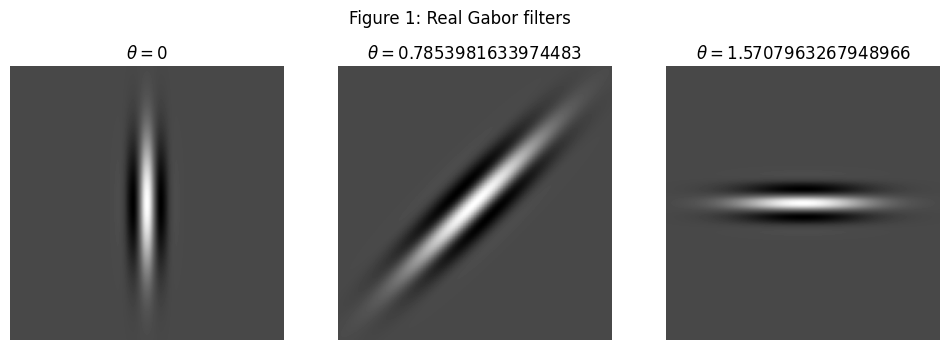

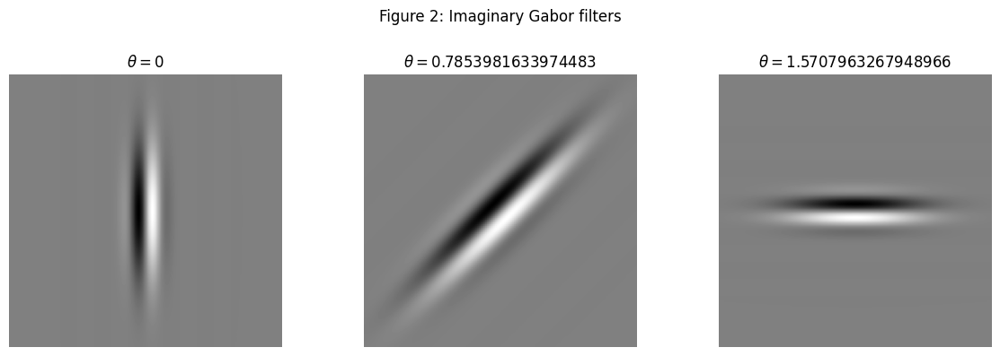

In [47]:
# YOUR CODE HERE

labda = 30
theta = 0
psi = 0
sigma = 10
gamma = 0.25

thetas = [0, np.pi/4, np.pi/2]

fig, axes = plt.subplots(1, 3, figsize=(12,4))
fig.suptitle(f"Figure 1: Real Gabor filters")

for i, th in enumerate(thetas):
    gabor = create_gabor(sigma, th, labda, psi, gamma)
    real = gabor[:,:, 0]

    ax = axes[i]
    ax.imshow(real, cmap='gray')
    ax.set_title(rf"$\theta = {th}$")
    ax.axis('off')

fig_imag, axes_I = plt.subplots(1, 3, figsize=(12,4))
fig_imag.suptitle(f"Figure 2: Imaginary Gabor filters")

for j, th in enumerate(thetas):
    gabor = create_gabor(sigma, th, labda, psi, gamma)
    imagine = gabor[:,:,1]

    ax = axes_I[j]
    ax.imshow(imagine, cmap='gray')
    ax.set_title(rf"$\theta = {th}$")
    ax.axis('off')

plt.tight_layout(rect=[0,0,1,0.93])
plt.show()

>Figure 1 shows the real Gabor filters with different theta values.
>
>Figure 2 shows the imaginary Gabor filters with different theta values.

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (1 point)</font>

Visualize how the parameter $\sigma$ affects the Gabor filter in the spatial domain. Use the following steps:

1. Initialize the parameters as follows: $\lambda = 35$, $\theta = \pi/6$, $\psi = \pi/4$, $\sigma = 10$, $\gamma = 0.5$.
2. Set $\sigma$ to $10$, $30$, and $45$ while keeping the other parameters unchanged.
3. Generate and display the Gabor filters corresponding to each value of $\sigma$.
4. Ensure that each image in the visualization is clearly labeled to indicate the value of $\sigma$ it represents.

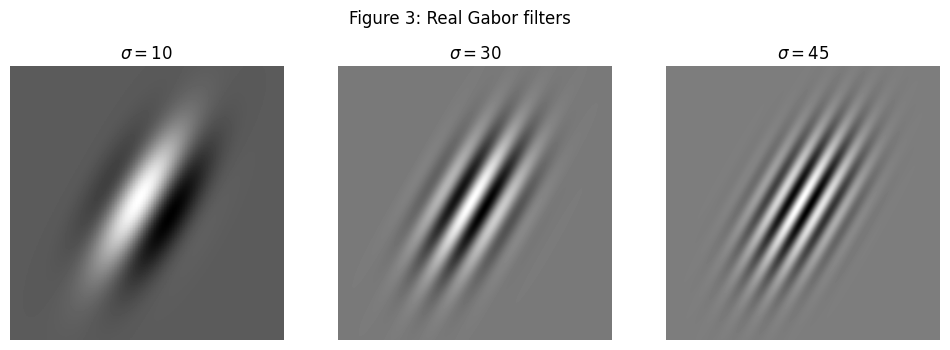

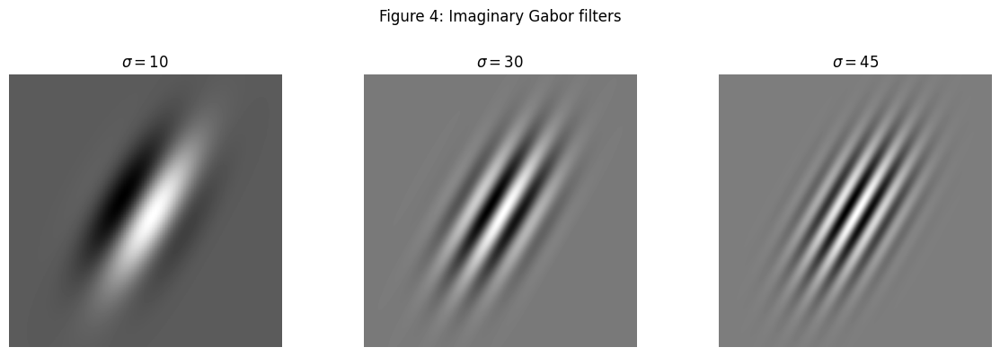

In [48]:
# YOUR CODE HERE

labda = 35
theta = np.pi/6
psi = np.pi/4
s = 10
gamma = 0.5

sigmas = [10, 30, 45]

fig, axes = plt.subplots(1, 3, figsize=(12,4))
fig.suptitle(f"Figure 3: Real Gabor filters")

for i, sigma in enumerate(sigmas):
    gabor = create_gabor(sigma, theta, labda, psi, gamma)
    real = gabor[:,:, 0]

    ax = axes[i]
    ax.imshow(real, cmap='gray')
    ax.set_title(rf"$\sigma = {sigma}$")
    ax.axis('off')

fig_imag, axes_I = plt.subplots(1, 3, figsize=(12,4))
fig_imag.suptitle(f"Figure 4: Imaginary Gabor filters")

for j, sigma in enumerate(sigmas):
    gabor = create_gabor(sigma, theta, labda, psi, gamma)
    imagine = gabor[:,:,1]

    ax = axes_I[j]
    ax.imshow(imagine, cmap='gray')
    ax.set_title(rf"$\sigma = {sigma}$")
    ax.axis('off')

plt.tight_layout(rect=[0,0,1,0.93])
plt.show()

>Figure 3 shows the real gabor filters with different sigma values.
>
>Figure 4 shows the imaginary Gabor filters with different sigma values.

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (1 point)</font>

Visualize how the parameter $\gamma$ affects the Gabor filter in the spatial domain. Use the following steps:

1. Initialize the parameters as follows: $\lambda = 25$, $\theta = \pi/3$, $\psi = \pi/6$, $\sigma = 8$, $\gamma = 0.75$.
2. Set $\gamma$ to $.25$, $.50$, and $.75$ while keeping the other parameters unchanged.
3. Generate and display the Gabor filters corresponding to each value of $\gamma$.
4. Ensure that each image in the visualization is clearly labeled to indicate the value of $\gamma$ it represents.


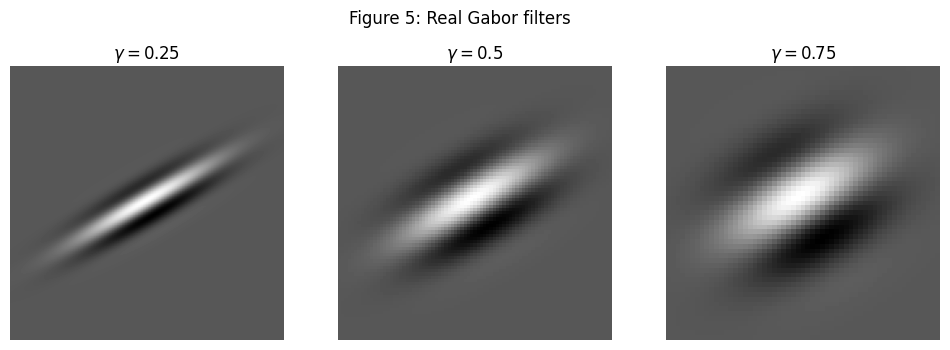

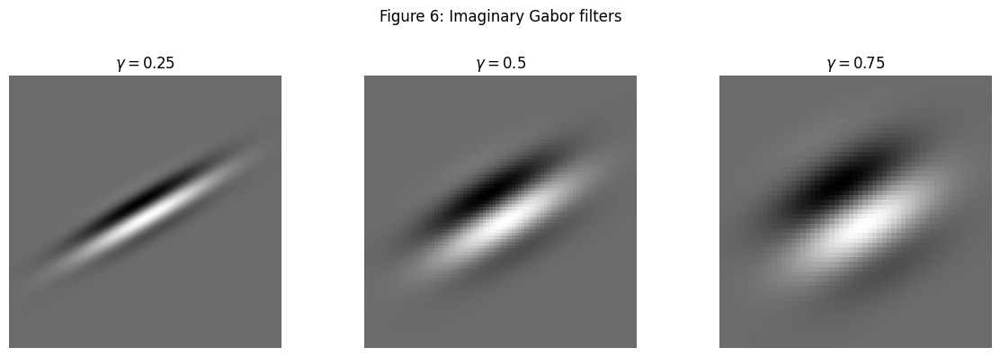

In [49]:
# YOUR CODE HERE

labda = 25
theta = np.pi/3
psi = np.pi/6
sigma = 8
g = 0.75

gammas = [0.25, 0.5, 0.75]

fig, axes = plt.subplots(1, 3, figsize=(12,4))
fig.suptitle(f"Figure 5: Real Gabor filters")

for i, gamma in enumerate(gammas):
    gabor = create_gabor(sigma, theta, labda, psi, gamma)
    real = gabor[:,:, 0]

    ax = axes[i]
    ax.imshow(real, cmap='gray')
    ax.set_title(rf"$\gamma = {gamma}$")
    ax.axis('off')

fig_imag, axes_I = plt.subplots(1, 3, figsize=(12,4))
fig_imag.suptitle(f"Figure 6: Imaginary Gabor filters")
for j, gamma in enumerate(gammas):
    gabor = create_gabor(sigma, theta, labda, psi, gamma)
    imagine = gabor[:,:,1]

    ax = axes_I[j]
    ax.imshow(imagine, cmap='gray')
    ax.set_title(rf"$\gamma = {gamma}$")
    ax.axis('off')

plt.tight_layout(rect=[0,0,1,0.93])
plt.show()

> Figure 5 shows the real Gabor filters with different gamma values.
>
>Figure 6 shows the imaginary Gabor filters with different gamma values.

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (6 points)</font>

Based on the visualizations of parameters and your self-study on Gabor filters, explain briefly:

1. What do the parameters $\lambda$, $\theta$, $\psi$, $\sigma$, and $\gamma$ control?
2. How do these parameters visually influence the Gabor filter kernel?

##### <font color='yellow'>Answer:</font>

>*$\lambda$ is the wavelength, it controls the frequency of the stripes. A large $\lambda$ focusses on the coarse structures and a smaller focusses on the small textures. The black and white stripes get closer together if the $\lambda$ is smaller\
$\theta$ is the angle of the filter as can be seen in Figure 1 and 2, so it influences the position of the stripes in the kernel \
$\psi$ it is the phase offset that the sinusoidal carrier is in. It influences if the filter detects bars or edges\
$\sigma$ controls the width of the Gaussian (std) and the a big $\sigma$ captures global structures and a small $\sigma$ captures finer local details. It controls the number of black and white stripes in the kernel \
$\gamma$ scales x and y ratio. If gamma is 1 its isotropic and if its smaller it becomes more elliptical. It is used for detecting oriented features. It controls the bluriness the stripes in the kernelof the kernel *

Movellan, J. R. (z.d.-a). Tutorial on Gabor Filters. https://www.google.com/url?sa=t&source=web&rct=j&opi=89978449&url=https://mplab.ucsd.edu/tutorials/gabor.pdf

<a id="section-4"></a>
### **Section 4: Noise in digital images**

Digital images are often plagued by various types of noise that can significantly degrade their quality. These imperfections might originate during the image acquisition process, where sensors introduce noise, or through user errors, such as incorrect camera settings. For example, some medical imaging modalities generate low-resolution images (e.g., 128x128 pixels) that are particularly susceptible to noise. Given the exponential increase in the number of photos taken daily, enhancing noisy or corrupted images has become a critical area of research in image processing.

Noise in digital images can manifest in several ways, two of the most common being salt-and-pepper noise and additive Gaussian noise.

**Salt-and-Pepper Noise:** This type of noise is characterized by random occurrences of black and white pixels scattered across the image. It can result from overexposure, which creates "hot" pixels, or from defective sensors, leading to "dead" pixels. These randomly placed black and white pixels resemble the appearance of salt and pepper sprinkled on the image, hence the name.

**Additive Gaussian Noise:** Another prevalent type of noise is additive Gaussian noise, often associated with thermal effects in the camera sensor. This noise is modeled by adding a random value to each pixel in the image. The random value, denoted by $\epsilon$, is drawn from a Gaussian distribution with a mean of 0 and a standard deviation, $\sigma$, which represents the noise level. The relationship between the original image $\mathbf{I}(x)$ and the noisy image $\mathbf{I}^{\prime}(x)$ can be described by the following equation:

$\mathbf{I}^{\prime}(x) = \mathbf{I}(x) + \epsilon \quad \text{where} \quad \epsilon \sim \mathcal{N}(0, \sigma^2)$ *(Equation D)*

In this scenario, $\mathbf{I}(x)$ represents the original image, and $\mathbf{I}^{\prime}(x)$ is the resulting image after Gaussian noise has been added. The noise $\epsilon$ is sampled independently for each pixel from the Gaussian distribution $\mathcal{N}(0, \sigma^2)$, where $\sigma$ controls the intensity of the noise. As $\sigma$ increases, the image becomes progressively noisier.

Both salt-and-pepper noise and additive Gaussian noise are common in real-world imaging scenarios and require effective noise reduction techniques. In the upcoming sections, we will explore various methods for mitigating these types of noise, enhancing the quality of digital images, and ensuring that the final images are closer to their true representations.

<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

The Peak Signal-to-Noise Ratio (PSNR) is a commonly used metric for quantitatively evaluating the performance of image enhancement algorithms. It is derived from the Mean Squared Error (MSE), which measures the average squared difference between the original image and the enhanced (or approximated) image. The MSE is defined as:

$MSE = \frac{1}{m \cdot n} \sum_{x,y}\left[\mathbf{I}(x,y) - \mathbf{\hat{I}}(x,y)\right]^2$ *(Equation E)*

where $\mathbf{I}$ is the original image of size $m \times n$, and $\mathbf{\hat{I}}$ is the enhanced or approximated version of the image.

The PSNR is then calculated using the MSE, and it quantifies how close the enhanced image is to the original image. The PSNR is defined as:

$PSNR = 10 \cdot \log_{10} \left(\frac{\mathbf{I}_{max}^2}{MSE}\right) \\
= 20 \cdot \log_{10} \left(\frac{\mathbf{I}_{max}}{\sqrt{MSE}}\right) \\
= 20 \cdot \log_{10} \left(\frac{\mathbf{I}_{max}}{RMSE}\right)$

where $\mathbf{I}_{max}$ is the maximum possible pixel value of the image (e.g., 255 for an 8-bit image), and $RMSE$ is the root of the MSE.

Given this understanding, answer the following:

When comparing different methods using the PSNR metric, is a higher value better, or is the opposite true? Explain your answer briefly.

##### <font color='yellow'>Answer:</font>

>By filling in the formula, we see that a smaller MSE gives a higher PSNR value. For example, with MSE = 0.01 the PSNR is 68.1308, and with MSE = 0.7 the PSNR is 49.67982. This shows that when the error is smaller, the PSNR has a higher value.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Implement the function `calculate_psnr()` to calculate the Peak Signal-to-Noise Ratio (PSNR) for both grayscale and RGB images. The function should take two images as input: the original image and its enhanced (or approximated) version.

When implementing `calculate_psnr()`, ensure that it works correctly for both grayscale and RGB images. For RGB images, consider how the PSNR formula should be adjusted. Specifically, think about whether to compute the PSNR for each channel separately and then combine the results, or handle the RGB image differently.

**Note:** You are not allowed to use any Python built-in functions from the *PIL* or *Skimage* libraries or any other libraries except for *NumPy*.

In [50]:
def calculate_psnr(orig_image, approx_image):
    '''
    Computes the PSNR (Peak Signal-to-Noise Ratio) between an original image and its enhanced version.

    Args:
        orig_image: The original image (can be grayscale or RGB).
        approx_image: The enhanced or approximated version of the original image.

    Returns:
        psnr_value: The PSNR value in decibels (dB).
    '''

    # YOUR CODE HERE
    if orig_image.ndim == 2:
        m, n = orig_image.shape
        c = 1
    else:
        m, n, c = orig_image.shape
    
    orig_image = orig_image.astype(np.float32)
    approx_image = approx_image.astype(np.float32)
    
    mse = 0
    if c == 1:
        for y in range(m):
            for x in range(n):
                mse += (orig_image[y, x] - approx_image[y, x])**2
    else:
        for y in range(m):
            for x in range(n):
                for channel in range(c):
                    mse += (orig_image[y, x, channel] - approx_image[y, x, channel])**2
    mse /= (m * n * c)

    max_pixel = 255
    psnr_value = 10 * np.log10((max_pixel)**2/mse)
    return psnr_value

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (1 point)</font>

Using your implemented function `calculate_psnr()`, compute and print the PSNR between `frans_bauer.png` and `frans_bauer_salt_pepper.png`.

**Hint:** Ensure that the data type of the images is `float32` before computation.

In [51]:
# YOUR CODE HERE
orig_image = cv2.imread("./images/frans_bauer.png")
approx_image = cv2.imread("./images/frans_bauer_salt_pepper.png")
calculate_psnr(orig_image, approx_image)

17.92140328117824

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

Using your implemented function `calculate_psnr()`, compute and print the PSNR between `frans_bauer.png` and `frans_bauer_gaussian.png`.

**Hint:** Ensure that the data type of the images is `float32` before computation.

In [52]:
# YOUR CODE HERE
orig_image = cv2.imread("./images/frans_bauer.png")
approx_image = cv2.imread("./images/frans_bauer_gaussian.png")
calculate_psnr(orig_image, approx_image)

27.735987230966433

<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (3 points)</font>

Design a function called `denoise_image()` to remove two types of noise: salt-and-pepper noise and Gaussian noise. The function should denoise the image by applying one of the following methods: box filtering using **cv2.blur** function, median filtering using **cv2.medianBlur** function, or Gaussian filtering using **cv2.GaussianBlur** function.

In [53]:
def denoise_image(input_image, kernel_type, kernel_size=3, sigma=1):
    '''
    Function denoises the image using the specified kernel type:
    - 'box': by using a box filter
    - 'median': by using a median filter
    - 'gaussian': by using a gaussian filter
    
    Args:
        input_image: The input image to be denoised.
        kernel_type: A string specifying the type of filter ('box', 'median', or 'gaussian').
        kernel_size: Size of the kernel to be used for filtering (default is 3).
        sigma: Standard deviation for the Gaussian kernel (used only for the gaussian filter).

    Returns:
        denoised_image: The denoised image.
    '''

    if kernel_type == 'box':

        # YOUR CODE HERE
        denoised_image = cv2.blur(input_image, (kernel_size, kernel_size))

    elif kernel_type == 'median':

        # YOUR CODE HERE
        denoised_image = cv2.medianBlur(input_image, kernel_size)

    elif kernel_type == 'gaussian':
        
        # YOUR CODE HERE
        denoised_image = cv2.GaussianBlur(input_image, (kernel_size, kernel_size), sigma)

    else:
        raise ValueError('Kernel type not implemented. Choose between "box", "median", or "gaussian".')

    return denoised_image

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Using your implemented function **denoise_image()**, denoise the `frans_bauer_salt_pepper.png` and `frans_bauer_gaussian.png` images by applying box filtering with kernel sizes of 3x3, 5x5, and 7x7. Display the resulting denoised images.

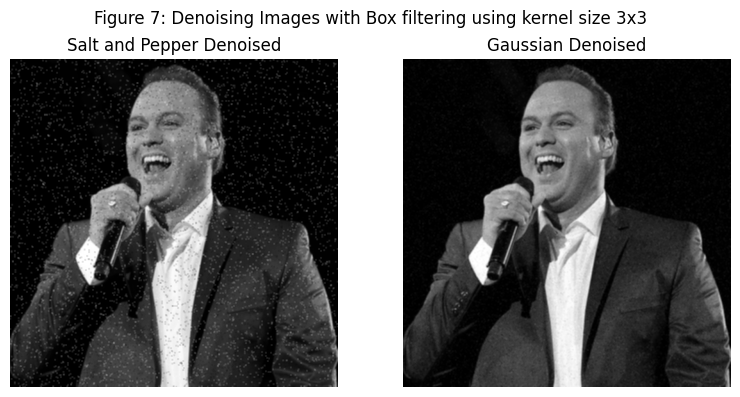

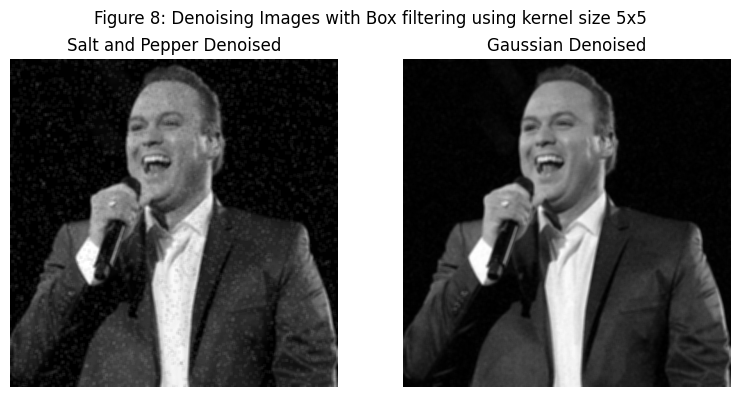

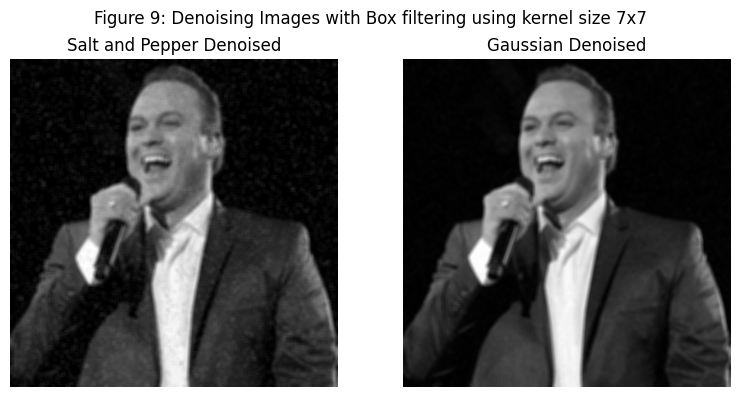

In [54]:
# YOUR CODE HERE
denoised_images = {"salt_pepper": {"box": {}, "median": {}, "gaussian": {}}, "gaussian": {"box": {}, "median": {}, "gaussian": {}}}
input_image1 = cv2.imread("./images/frans_bauer_salt_pepper.png", cv2.IMREAD_GRAYSCALE)
input_image2 = cv2.imread("./images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
kernel_sizes = [3, 5, 7]
kernel_type = 'box'
for figure_number, kernel_size in enumerate(kernel_sizes, start=7):
    denoised_image1 = denoise_image(input_image1, kernel_type, kernel_size)
    denoised_image2 = denoise_image(input_image2, kernel_type, kernel_size)
    
    denoised_images["salt_pepper"][kernel_type][kernel_size] = denoised_image1
    denoised_images["gaussian"][kernel_type][kernel_size] = denoised_image2

    fig = plt.figure(figsize=(8,4))
    fig.suptitle(f"Figure {figure_number}: Denoising Images with Box filtering using kernel size {kernel_size}x{kernel_size}")

    plt.subplot(1, 2, 1)
    plt.imshow(denoised_image1, cmap="gray")
    plt.title("Salt and Pepper Denoised")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(denoised_image2, cmap="gray")
    plt.title("Gaussian Denoised")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

Figure 7 shows two images where box filtering was applied with a kernel size of 3x3. The left image shows the denoised salt and pepper noise and the right image shows the denoised gaussian noise. The kernel size is small, so the noise is not perfectly removed.

Figure 8 shows two images where box filtering was applied with a kernel size of 5x5. The left image shows the denoised salt and pepper noise and the right image shows the denoised gaussian noise. The kernel size is mid-size, so the noise is a bit removed, but the images are starting to lose detail too.

Figure 9 shows two images where box filtering was applied with a kernel size of 7x7. The left image shows the denoised salt and pepper noise and the right image shows the denoised gaussian noise. The kernel size is large, so both images look blurry.

<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (2 points)</font>

Using your implemented function **denoise_image()**, denoise the `frans_bauer_salt_pepper.png` and `frans_bauer_gaussian.png` images by applying median filtering with kernel sizes of 3x3, 5x5, and 7x7. Display the resulting denoised images.

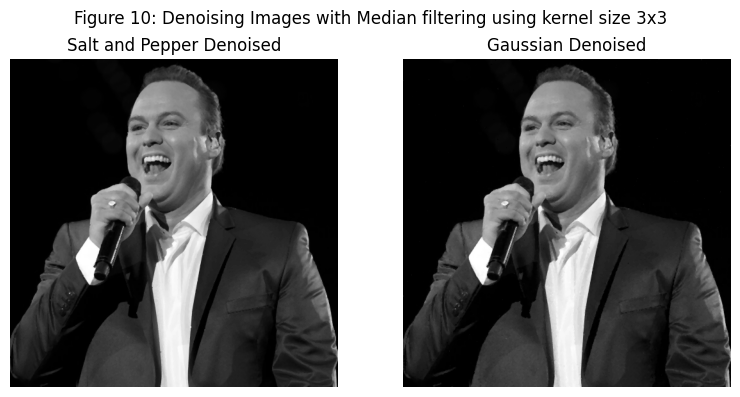

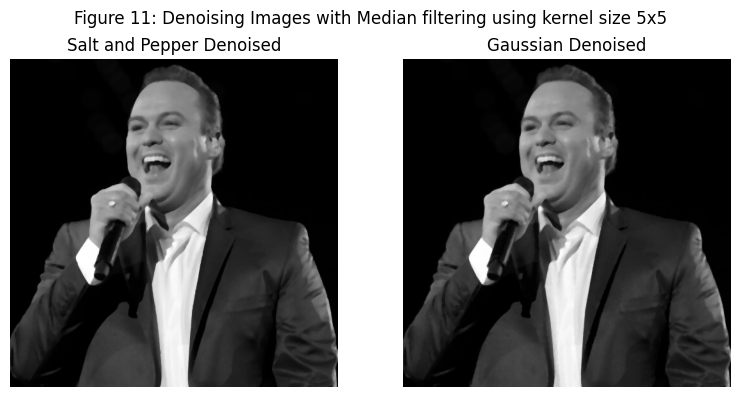

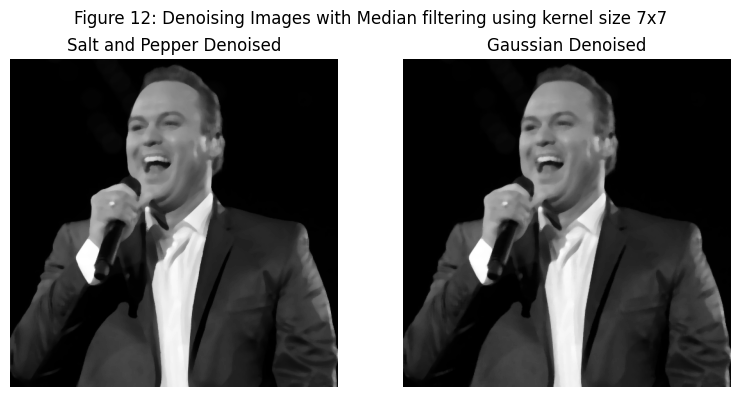

In [55]:
# YOUR CODE HERE
input_image1 = cv2.imread("./images/frans_bauer_salt_pepper.png", cv2.IMREAD_GRAYSCALE)
input_image2 = cv2.imread("./images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
kernel_sizes = [3, 5, 7]
kernel_type = 'median'
for figure_number, kernel_size in enumerate(kernel_sizes, start=10):
    denoised_image1 = denoise_image(input_image1, kernel_type, kernel_size)
    denoised_image2 = denoise_image(input_image2, kernel_type, kernel_size)

    denoised_images["salt_pepper"][kernel_type][kernel_size] = denoised_image1
    denoised_images["gaussian"][kernel_type][kernel_size] = denoised_image2
    
    fig = plt.figure(figsize=(8,4))
    fig.suptitle(f"Figure {figure_number}: Denoising Images with Median filtering using kernel size {kernel_size}x{kernel_size}")

    plt.subplot(1, 2, 1)
    plt.imshow(denoised_image1, cmap="gray")
    plt.title("Salt and Pepper Denoised")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(denoised_image2, cmap="gray")
    plt.title("Gaussian Denoised")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

Figure 10 shows two images where median filtering was applied with a kernel size of 3x3. The left image shows the denoised salt and pepper noise and the right image shows the denoised gaussian noise. The kernel size is small, so the noise on both images is removed, while the details of the images are kept too.

Figure 11 shows two images where median filtering was applied with a kernel size of 5x5. The left image shows the denoised salt and pepper noise and the right image shows the denoised gaussian noise. The kernel size is mid-size, so the noise is removed, but the images start to lose details.

Figure 12 shows two images where median filtering was applied with a kernel size of 7x7. The left image shows the denoised salt and pepper noise and the right image shows the denoised gaussian noise. The kernel size is large, so both images look very blurry.

<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Using your implemented function **my_psnr()**, compute the PSNR for each of the 12 denoised images (from Questions 19 and 20) with respect to the original `frans_bauer.png` image. Present your results in a clear and readable format **and** discuss the effect of the filter size on the PSNR. 

**Hint:** Ensure that the images are loaded as `float32` before computation.

In [56]:
# YOUR CODE HERE
orig_image = cv2.imread("./images/frans_bauer.png", cv2.IMREAD_GRAYSCALE)
noise_types = ["salt_pepper", "gaussian"]
kernel_types = ["box", "median"]
all_psnrs = {"salt_pepper": {"box": {}, "median": {}}, "gaussian": {"box": {}, "median": {}}}
for noise_type in noise_types:
    for kernel_type in kernel_types:
        for kernel_size in kernel_sizes:
            denoised = denoised_images[noise_type][kernel_type][kernel_size]
            psnr = calculate_psnr(orig_image, denoised)
            all_psnrs[noise_type][kernel_type][kernel_size] = psnr
            print(f"noise = '{noise_type}' - kernel type = '{kernel_type}' - kernel size = '{kernel_size}x{kernel_size}' - PSNR = {psnr:.3f}")


noise = 'salt_pepper' - kernel type = 'box' - kernel size = '3x3' - PSNR = 25.786
noise = 'salt_pepper' - kernel type = 'box' - kernel size = '5x5' - PSNR = 26.402
noise = 'salt_pepper' - kernel type = 'box' - kernel size = '7x7' - PSNR = 25.770
noise = 'salt_pepper' - kernel type = 'median' - kernel size = '3x3' - PSNR = 34.832
noise = 'salt_pepper' - kernel type = 'median' - kernel size = '5x5' - PSNR = 31.341
noise = 'salt_pepper' - kernel type = 'median' - kernel size = '7x7' - PSNR = 29.712
noise = 'gaussian' - kernel type = 'box' - kernel size = '3x3' - PSNR = 30.896
noise = 'gaussian' - kernel type = 'box' - kernel size = '5x5' - PSNR = 28.323
noise = 'gaussian' - kernel type = 'box' - kernel size = '7x7' - PSNR = 26.793
noise = 'gaussian' - kernel type = 'median' - kernel size = '3x3' - PSNR = 34.337
noise = 'gaussian' - kernel type = 'median' - kernel size = '5x5' - PSNR = 31.267
noise = 'gaussian' - kernel type = 'median' - kernel size = '7x7' - PSNR = 29.654


##### <font color='yellow'>Answer:</font>

> The effects of filter type and kernel size are visible from the PSNR results. For box filtering, images with salt and pepper noise have a lower PSNR value than images with Gaussian noise under the same filter. In general, increasing the kernel size leads to a lower PSNR, which shows that smaller kernels work better for box filtering. An exception for this is salt and pepper noise, where the 5x5 kernel gives the highest PSNR value. 

>For median filtering, smaller kernels perform the best. Median filtering removes noise completely from the image (which is also shown by the PSNR being a lot higher compared to the box filtering). This can also be seen in Figures 7 to 12. Larger kernels smooth out the image too much, making it lose details. This is seen best in Figure 12, where the image is really blurry due to a large kernel size. The method that removes noise the most effective whilst also keeping details is the median filtering method with a kernel size of 3.

<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (2 points)</font>

Which filter is more effective for removing salt-and-pepper noise, box or median filters? Explain your reasoning. Also, consider which filter performs better for Gaussian noise and why.

##### <font color='yellow'>Answer:</font>

>As seen in Figures 7 and 10, noise is fully removed in median filtering methods for salt-and-pepper noise, while the box filters keep a lot of the noise. This is because this kind of noise adds a lot of white spots. Box filtering takes the average of the neighborhood, and since there is alot of white spots, this affects the average value. Median filtering takes the median of the neighborhood. There are more spots that have the real color value, so this value is the median of that neighborhood.

>The median filter also performs better for Gaussian noise (as seen in Figures 7 and 10). The gaussian noise is visible in Figure 7, while it is fully removed in Figure 10. This is because even if there is a lot of different color spots in the neighborhood, median filtering selects the median value in that neighborhood, which is closer to the true color value of that area. Box filtering averages all pixels in the neighborhood, which pushes the pixel values closer towards the real color value, but not fully.

<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Using your implemented function **denoise_image()**, denoise the `frans_bauer_gaussian.png` image by applying Gaussian filtering with kernel sizes of 3x3, 5x5, and 7x7, and standard deviations of 0.5, 1, 3, and 7.

Display the resulting denoised images.

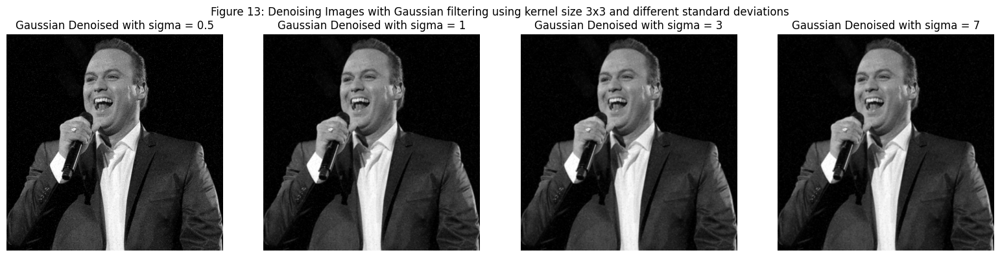

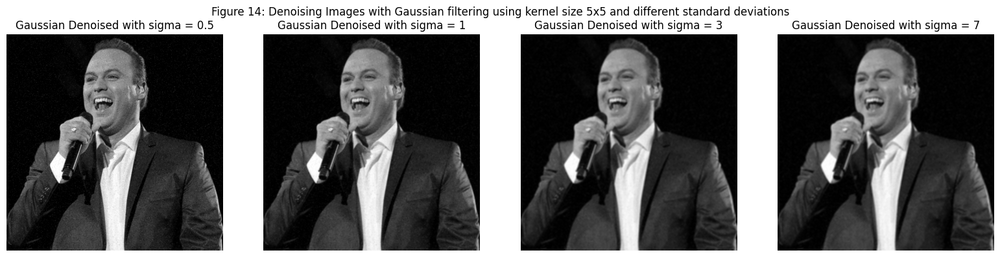

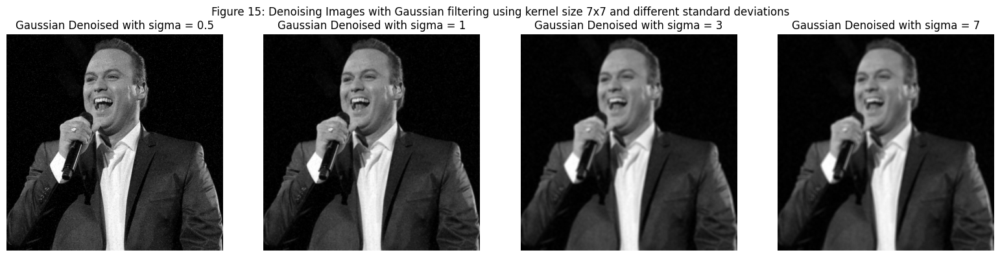

In [57]:
# YOUR CODE HERE
input_image = cv2.imread("./images/frans_bauer_gaussian.png", cv2.IMREAD_GRAYSCALE)
kernel_sizes = [3, 5, 7]
stds = [0.5, 1, 3, 7]
kernel_type = 'gaussian'
for figure_number, kernel_size in enumerate(kernel_sizes, start=13):
    fig = plt.figure(figsize=(16,4))
    fig.suptitle(f"Figure {figure_number}: Denoising Images with Gaussian filtering using kernel size {kernel_size}x{kernel_size} and different standard deviations")
    for i, std in enumerate(stds, start=1):
        denoised_image = denoise_image(input_image, kernel_type, kernel_size, std)

        if kernel_size not in denoised_images["gaussian"][kernel_type]:
            denoised_images["gaussian"][kernel_type][kernel_size] = {}
        denoised_images["gaussian"][kernel_type][kernel_size][std] = denoised_image
        
        plt.subplot(1, len(stds), i)
        plt.imshow(denoised_image, cmap="gray")
        plt.title(f"Gaussian Denoised with sigma = {std}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

Figure 13 shows Gaussian filtering with sigma ranging from 0.5 to 7, using a kernel size of 3x3 on an image with Gaussian noise. Noise is removed a bit with higher sigma values.

Figure 14 shows Gaussian filtering with sigma ranging from 0.5 to 7, using a kernel size of 5x5 on an image with Gaussian noise. Noise is removed a bit with lower sigma values, and with higher sigma values the denoised image starts to become blurry.

Figure 15 shows Gaussian filtering with sigma ranging from 0.5 to 7, using a kernel size of 7x7 on an image with Gaussian noise. Noise is removed a bit with lower sigma values, but the denoised image quickly starts to become blurry with higher sigma values.

<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (3 points)</font>

Present your results for the PSNR scores of the 12 images from Question 22 in a clear and readable format **and** discuss the effect of the standard deviation on the PSNR.

In [58]:
# YOUR CODE HERE
orig_image = cv2.imread("./images/frans_bauer.png", cv2.IMREAD_GRAYSCALE)
noise_types = "gaussian"
kernel_types = "gaussian"
all_psnrs = {"gaussian": {"gaussian": {"kernel_size": {}}}}
for kernel_size in kernel_sizes:
    for std in stds:
        denoised = denoised_images[noise_type][kernel_type][kernel_size][std]
        psnr = calculate_psnr(orig_image, denoised)
        all_psnrs[noise_type][kernel_type][kernel_size] = psnr
        print(f"noise = '{noise_type}' - kernel type = '{kernel_type}' - kernel size = '{kernel_size}x{kernel_size}' - sigma = '{std}' - PSNR = {psnr:.3f}")


noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '3x3' - sigma = '0.5' - PSNR = 30.936
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '3x3' - sigma = '1' - PSNR = 31.704
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '3x3' - sigma = '3' - PSNR = 30.973
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '3x3' - sigma = '7' - PSNR = 30.913
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '5x5' - sigma = '0.5' - PSNR = 30.936
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '5x5' - sigma = '1' - PSNR = 31.072
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '5x5' - sigma = '3' - PSNR = 28.631
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '5x5' - sigma = '7' - PSNR = 28.387
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '7x7' - sigma = '0.5' - PSNR = 30.936
noise = 'gaussian' - kernel type = 'gaussian' - kernel size = '7x7' - sigma = '1' - PSNR = 30.984
noise = 'gauss

##### <font color='yellow'>Answer:</font>

> Going from sigma = 0.5 to 1 seems to improve the PSNR slightly, but going from sigma = 1 to 3 or 7 makes the PSNR drop a lot. This is also visible in Figures 13 to 15, where the image starts to become blurry and lose its details, which causes the PSNR to drop. This happens because a larger sigma means the pixels away from the center of the neighborhood are also taken more into account, which causes blur.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (2 points)</font>

What is the difference among median filtering, box filtering, and Gaussian filtering? Briefly explain how they are different at a conceptual level. If two filtering methods give similar PSNR values, can you see a qualitative difference?

##### <font color='yellow'>Answer:</font>

>- Box filtering takes all the pixels in the neighborhood and averages them with equal weight. This reduces noise but also blurs edges.
>- Median filtering takes all the pixels in the neighborhood and takes the median (middle value). This removes outlier (the noise) and keeps the edges mostly.
>- Gaussian filtering takes all the pixels in the neighborhood and weights them according to a Gaussian distribution. Here the center pixel has the heighest weight and pixels away from the edge have a lower weight. Pixels away from the center get a higher weight if sigma is set to a higher number.

> Figure 7 (Gaussian noise with 3x3 kernel and box filtering) and Figure 11 (Gaussian noise with 5x5 kernel and median filtering) have a similar PSNR value of around 31, but the images look different. Figure 11 is a lot more blurry, while Figure 7 is more clear but has some noise in the image. So even if the PSNR values are similar, there is a qualitative difference.

<a id="section-5"></a>
### **Section 5: Edge Detection**

Edges in digital images represent areas where there is a significant change in brightness, often corresponding to the boundaries of objects. Detecting these edges is a crucial task in many computer vision applications, such as autonomous driving, where edge detection can be used to identify road boundaries and determine the vehicle's trajectory.

In this section, we will explore various techniques for edge detection, focusing specifically on filters that extract the gradient of the image. The gradient represents the rate of change in brightness and is calculated using first-order derivative filters. The Sobel operator, one of the most common methods, approximates the first derivative of a Gaussian filter and is used to detect edges by highlighting the intensity gradients in an image.

The Sobel operator uses two 3x3 convolution kernels, one for detecting changes in the horizontal direction (G_x) and the other for the vertical direction (G_y). The kernels are defined as follows:

$G_x = \begin{bmatrix} +1 & 0 & -1 \\ +2 & 0 & -2 \\ +1 & 0 & -1 \end{bmatrix} * \mathbf{I}$

$G_y = \begin{bmatrix} +1 & +2 & +1 \\ 0 & 0 & 0 \\ -1 & -2 & -1 \end{bmatrix} * \mathbf{I}$

The gradient magnitude, which combines the horizontal and vertical gradients, is given by:

$G =\sqrt {{G_x}^2+{G_y}^2}$

The direction of the gradient, indicating the orientation of the edge, is calculated as:

$\theta= \tan^{-1}\left(\frac{G_y}{G_x}\right)$

These calculations allow us to detect and quantify edges in an image. In this section, we will apply these methods to extract edges from images, with a particular focus on detecting roads in still images, which is a critical task in autonomous driving systems.

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (4 points)</font>

Implement the function **compute_image_gradient()** to compute the gradients of an image. This function should calculate the gradients in both the x and y directions, as well as the gradient magnitude and direction.

You are not allowed to use Python built-in functions for computing gradients, but you may use the `scipy.signal.convolve2d` function for performing 2D convolution.

Additionally, complete the helper function **normalize_image()** to normalize the gradients.

In [59]:
def normalize_image(image: np.ndarray, low=0, high=1) -> np.ndarray:
    '''
    Normalizes the input image to a specified range [low, high].

    Args:
        image: The input image as a numpy array.
        low: The lower bound of the normalization range (default is 0).
        high: The upper bound of the normalization range (default is 1).

    Returns:
        normalized_image: The normalized image as a numpy array.
    '''

    # Convert the image to float32 for precision during normalization
    image = image.astype(np.float32)
    
    min_v = float(np.min(image))
    max_v = float(np.max(image))

    # Handle the degenerate case (constant image)
    if max_v == min_v:
        return np.full_like(image, fill_value=low, dtype=np.float32)

    norm01 = (image - min_v) / (max_v - min_v)
    normalized_image = norm01 * (high - low) + low
    normalized_image = normalized_image.astype(np.float32)
    
    return normalized_image

In [60]:
def compute_image_gradient(input_image: np.ndarray):
    '''
    Computes the gradients of the input image in both x and y directions,
    along with the gradient magnitude and direction.

    Args:
        input_image: The input image as a 2D numpy array.

    Returns:
        gradient_x: The gradient of the image in the x direction.
        gradient_y: The gradient of the image in the y direction.
        gradient_magnitude: The magnitude of the gradient.
        gradient_direction: The direction of the gradient (in degrees).
    '''

    # Sobel kernels for x and y directions
    sobel_x = [[1, 0, -1],
               [2, 0, -2],
               [1, 0, -1]]

    sobel_y = [[1, 2, 1],
               [0, 0, 0],
               [-1, -2, -1]]

    img = input_image.astype(np.float32)
    kx = np.asarray(sobel_x, dtype=np.float32)
    ky = np.asarray(sobel_y, dtype=np.float32)

    # Convolution with symmetric padding, same output size
    gradient_x = scipy.signal.convolve2d(img, kx, mode='same', boundary='symm').astype(np.float32)
    gradient_y = scipy.signal.convolve2d(img, ky, mode='same', boundary='symm').astype(np.float32)

    # Magnitude and direction (direction in degrees, range [-180, 180])
    gradient_magnitude = np.hypot(gradient_x, gradient_y).astype(np.float32)
    gradient_direction = np.degrees(np.arctan2(gradient_y, gradient_x)).astype(np.float32)


    return gradient_x, gradient_y, gradient_magnitude, gradient_direction

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (3 points)</font>

Using your implemented function **compute_image_gradient()** on `landscape.jpg`, display the following figures:

1. The gradient of the image in the x-direction.
2. The gradient of the image in the y-direction.
3. The gradient magnitude of each pixel.
4. The gradient direction of each pixel.

Discuss what kind of information each image conveys.

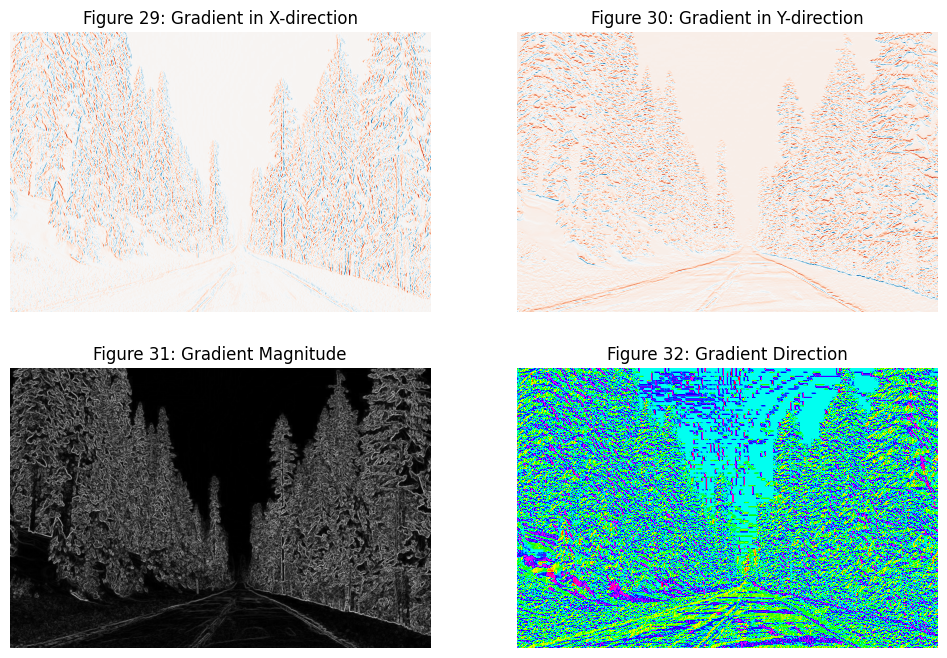

In [61]:
# Load image (grayscale for gradients)
image = cv2.imread("images/landscape.jpg", cv2.IMREAD_GRAYSCALE)

# Compute gradients
grad_x, grad_y, grad_mag, grad_dir = compute_image_gradient(image)

# Normalize for visualization
grad_x_norm = normalize_image(grad_x)
grad_y_norm = normalize_image(grad_y)
grad_mag_norm = normalize_image(grad_mag)
grad_dir_norm = normalize_image(grad_dir)  # direction visualization (scaled to [0,1])

# Plot results
plt.figure(figsize=(12,8))

plt.subplot(2,2,1)
plt.imshow(grad_x_norm, cmap='RdBu')
plt.title("Figure 29: Gradient in X-direction")
plt.axis('off')

plt.subplot(2,2,2)
plt.imshow(grad_y_norm, cmap='RdBu')
plt.title("Figure 30: Gradient in Y-direction")
plt.axis('off')

plt.subplot(2,2,3)
plt.imshow(grad_mag_norm, cmap='gray')
plt.title("Figure 31: Gradient Magnitude")
plt.axis('off')

plt.subplot(2,2,4)
plt.imshow(grad_dir_norm, cmap='hsv')  # hsv shows orientation better
plt.title("Figure 32: Gradient Direction")
plt.axis('off')

plt.show()

##### <font color='yellow'>Answer:</font>

> - Figure 29: Gradient in the X-direction - Highlights vertical edges (changes in intensity along the horizontal axis). Bright regions correspond to strong vertical edges (like tree trunks).

> - Figure 30: Gradient in the Y-direction - Highlights horizontal edges (changes in intensity along the vertical axis). Bright regions correspond to strong horizontal edges (like horizon lines, ground layers).

> - Figure 31: Gradient Magnitude - Combines gradients in X and Y directions into overall edge strength. Bright areas show where edges are strongest regardless of orientation.

> - Figure 32: Gradient Direction - Shows the orientation of edges in degrees (−180° to +180°). Each pixel’s value corresponds to the angle of the edge. Horizontal edges correspond to ~0°, vertical edges to ~±90°. 

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (4 points)</font>

Compared to the Sobel filter, a Laplacian of Gaussian (LoG) relies on the second derivative of a Gaussian filter. Hence, it will focus on large gradients in the image.

Implement the function **compute_laplacian_of_gaussian()** to compute the Laplacian of Gaussian (LoG) for an image using each the following methods:

1. Smoothing the image with a Gaussian kernel, then applying the Laplacian (second derivative) to the smoothed image.
2. Convolving the image directly with a LoG kernel.
3. Computing the Difference of Gaussians (DoG) at different scales $\sigma_1$ and $\sigma_2$.

The function should take arguments *method*, *kernel_size*, *sigma*, *sigma_1*, and *sigma_2* to specify the parameters for each method.

**Note:** You are not allowed to use Python built-in functions for computing LoG kernels, but you can use `scipy.signal.convolve2d` for 2D convolution.

In [70]:
def compute_laplacian_of_gaussian(image, method, kernel_size=5, sigma=0.5, sigma_1=0.5, sigma_2=1.0):
    '''
    Computes the Laplacian of Gaussian (LoG) using the specified method.

    Args:
        image: Input image as a 2D numpy array.
        method: Specifies which method to use (1, 2, or 3).
        kernel_size: Size of the Gaussian kernel (default is 5).
        sigma: Standard deviation of the Gaussian for methods 1 and 2 (default is 0.5).
        sigma_1: Standard deviation of the first Gaussian for method 3 (default is 0.5).
        sigma_2: Standard deviation of the second Gaussian for method 3 (default is 1.0).

    Returns:
        log_image: The resulting image after applying the Laplacian of Gaussian.
    '''

    # Define the Laplacian kernel for the second derivative
    laplacian_kernel = np.array([[0, -1, 0],
                                 [-1, 4, -1],
                                 [0, -1, 0]])

    def _log_kernel_2d(kernel_size: int, sigma: float) -> np.ndarray:
        """
        Construct a 2D Laplacian-of-Gaussian kernel from the analytic formula
        """
        if kernel_size % 2 == 0:
            raise ValueError("kernel_size must be odd for a centered LoG kernel.")

        k = (kernel_size - 1) // 2
        yy, xx = np.mgrid[-k:k+1, -k:k+1]
        r2 = xx**2 + yy**2

        gaussian = np.exp(-r2 / (2.0 * sigma**2)) / (2.0 * np.pi * sigma**2)
        log = ((r2 - 2.0 * sigma**2) / (sigma**4)) * gaussian

        # Small zero-mean correction to counter discretization error
        log -= log.mean()
        return log.astype(np.float32)
    
    if method == 1:
        # Method 1: Gaussian smoothing followed by Laplacian
        G = gaussian_kernel_2D(sigma, sigma, kernel_size).astype(np.float32)
        smoothed = scipy.signal.convolve2d(image, G, mode='same', boundary='symm')
        log_image = scipy.signal.convolve2d(smoothed, laplacian_kernel, mode='same', boundary='symm').astype(np.float32)

    elif method == 2:
        # Method 2: Direct convolution with a LoG kernel
        LoG = _log_kernel_2d(kernel_size, sigma)
        log_image = scipy.signal.convolve2d(image, LoG, mode='same', boundary='symm').astype(np.float32)

    elif method == 3:
        # Method 3: Difference of Gaussians (DoG)
        G1 = gaussian_kernel_2D(sigma_1, sigma_1, kernel_size).astype(np.float32)
        G2 = gaussian_kernel_2D(sigma_2, sigma_2, kernel_size).astype(np.float32)
        blur1 = scipy.signal.convolve2d(image, G1, mode='same', boundary='symm')
        blur2 = scipy.signal.convolve2d(image, G2, mode='same', boundary='symm')
        log_image = (blur1 - blur2).astype(np.float32)

    else:
        raise ValueError("Invalid method. Choose 1, 2, or 3.")

    return log_image

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (1 point)</font>

Test your **compute_laplacian_of_gaussian()** function using `landscape.jpg` and visualize your results using the three methods. Use the default parameters provided for each method.

<>:32: SyntaxWarning: invalid escape sequence '\s'
<>:32: SyntaxWarning: invalid escape sequence '\s'
/var/folders/22/gxvfn3cx2_v64ngzhq52h2180000gn/T/ipykernel_20228/4045457285.py:32: SyntaxWarning: invalid escape sequence '\s'
  axes[3].set_title('Figure 36: LoG – Method 3: DoG ($\sigma_1$=0.5, $\sigma_2$=1.0)')


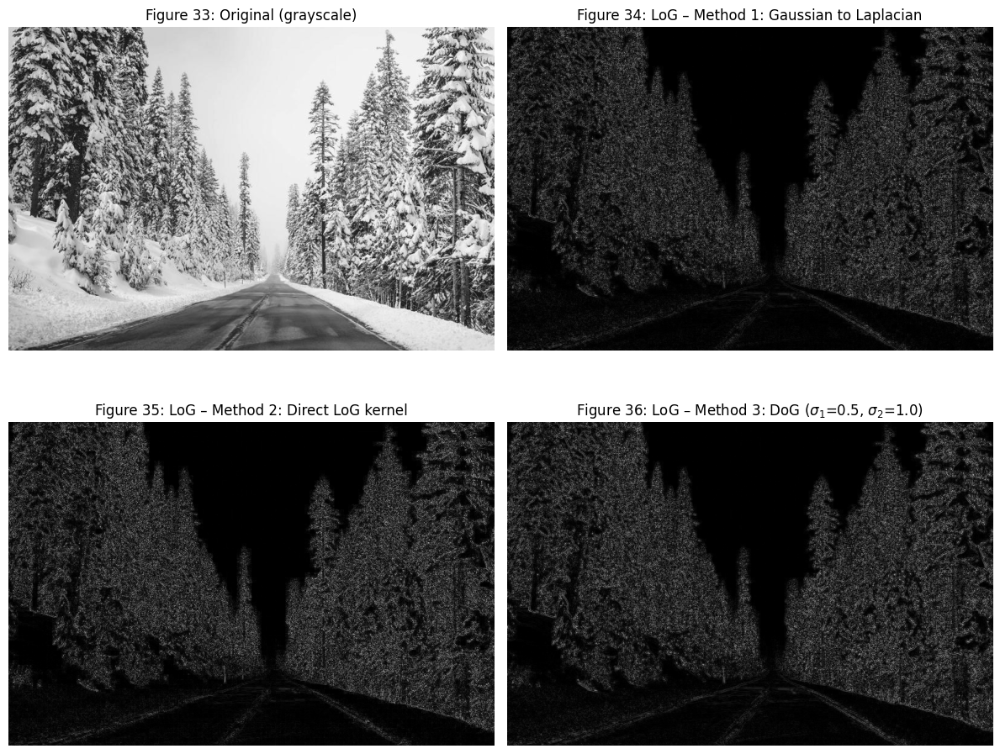

In [71]:
# original image
img = cv2.imread('images/landscape.jpg', cv2.IMREAD_GRAYSCALE).astype(np.float32)

# Run LoG with the three methods (defaults from your function signature)
log_m1 = compute_laplacian_of_gaussian(img, method=1)
log_m2 = compute_laplacian_of_gaussian(img, method=2)
log_m3 = compute_laplacian_of_gaussian(img, method=3, sigma=0.5, sigma_1=0.5, sigma_2=1)

# For visualization, show magnitude (LoG has positive/negative responses)
disp1 = normalize_image(np.abs(log_m1))
disp2 = normalize_image(np.abs(log_m2))
disp3 = normalize_image(np.abs(log_m3))

# Plot
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.ravel()


axes[0].imshow(normalize_image(img_rgb), cmap='gray')
axes[0].set_title('Figure 33: Original (grayscale)')
axes[0].axis('off')

axes[1].imshow(disp1, cmap='gray')
axes[1].set_title('Figure 34: LoG – Method 1: Gaussian to Laplacian')
axes[1].axis('off')

axes[2].imshow(disp2, cmap='gray')
axes[2].set_title('Figure 35: LoG – Method 2: Direct LoG kernel')
axes[2].axis('off')

axes[3].imshow(disp3, cmap='gray')
axes[3].set_title('Figure 36: LoG – Method 3: DoG ($\sigma_1$=0.5, $\sigma_2$=1.0)')
axes[3].axis('off')

plt.tight_layout()
plt.show()
    

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Discuss the differences between applying the three methods of the Laplacian of Gaussian (LoG) on `landscape.jpg`. Consider how each method approaches edge detection and the visual results produced by each technique.

##### <font color='yellow'>Answer:</font>

> Method 1 (Gaussian→Laplacian) and Method 2 (direct LoG) are mathematically equivalent up to a constant so they yield near-identical results, thin zero-crossing edges, while Method 3 (DoG) is a band-pass approximation that’s cheaper but produces slightly thicker, scale-dependent edges with contrast that varies with the $\sigma_1 / \sigma_2$ ratio, the higher are $\sigma$'s values, the higher is the contrast.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (2 points)</font>

In the first method, why is it important to convolve an image with a Gaussian before convolving with a Laplacian?

##### <font color='yellow'>Answer:</font>

> Because the Laplacian is a second-derivative operator that strongly amplifies high-frequency noise, so pre-smoothing with a Gaussian (a low-pass filter) suppresses noise and makes the signal differentiable, bringing stable, meaningful zero-crossing edges at a controllable scale $\sigma$

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (2 points)</font>

In the third method, what is the best ratio between $\sigma_1$ and $\sigma_2$ to achieve the best approximation of the LoG? What is the purpose of having two different standard deviations?

**Hint**: The best approximation for our case is found when both $\sigma_1$ and $\sigma_2$ are within the range of 1 to 10.

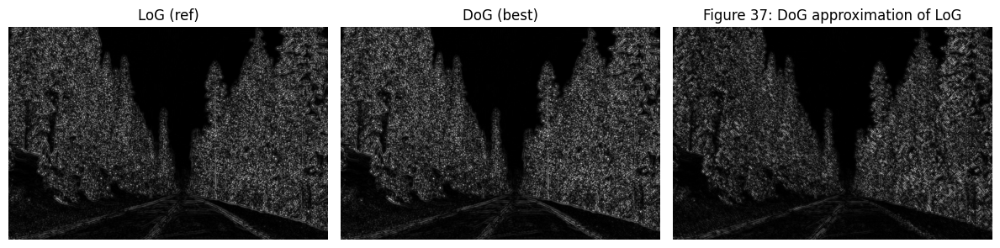

In [84]:
s1 = 1.5
s2 = 1.8

s_log = np.sqrt(s1 * s2)

img = cv2.imread('images/landscape.jpg', cv2.IMREAD_GRAYSCALE).astype(np.float32)

def odd_kernel_for_sigmas(s1, s2):
    k = int(2 * np.ceil(3 * max(s1, s2)) + 1)  # ~±3σ support
    return max(3, k | 1)

ks = odd_kernel_for_sigmas(s1, s2)

log_ref = compute_laplacian_of_gaussian(img, method=2, kernel_size=ks, sigma=s_log).astype(np.float32)
dog     = compute_laplacian_of_gaussian(img, method=3, kernel_size=ks, sigma_1=s1, sigma_2=s2).astype(np.float32)

# Best scalar to match amplitudes (least-squares)
denom = float((log_ref * log_ref).sum()) + 1e-12
alpha = float((dog * log_ref).sum() / denom)

diff = dog - alpha * log_ref
rmse = float(np.sqrt(np.mean(diff**2)))

# Quick visual check: abs difference should be near-black when approximation is good
fig, axs = plt.subplots(1, 3, figsize=(12, 4))
axs[0].imshow(np.abs(log_ref), cmap='gray'); axs[0].set_title('LoG (ref)'); axs[0].axis('off')
axs[1].imshow(np.abs(dog), cmap='gray');     axs[1].set_title('DoG (best)'); axs[1].axis('off')
axs[2].imshow(np.abs(diff), cmap='gray');    axs[2].set_title('|DoG - $alpha$ LoG|'); axs[2].axis('off')
plt.tight_layout(); plt.title("Figure 37: DoG approximation of LoG"); plt.show()

##### <font color='yellow'>Answer:</font>

> Two different sigmas make a band-pass: subtracting a broader blur from a narrower one cancels low frequencies and approximates the second derivative (LoG) at roughly $\sigma = \sqrt{\sigma_1 \sigma_2}$. Through the experimentation we found that the best approximation parameters for DoG to approximate LoG are $\sigma_1=1.5$ and $\sigma_2=1.8$ that show the highest correlation with LoG ($\sigma = \sqrt{\sigma_1 \sigma_2}$). visually on Figure 37 we can confirm that two images for LoG and DoG look very similar. 

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

What else is needed to improve the performance and isolate the road? You don't have to provide any specific parameter or algorithm. Propose a direction that would be interesting to explore and explain how you would approach it.

##### <font color='yellow'>Answer:</font>

> A strong next step is a geometry-aware, multi-cue segmentation pipeline. First restrict to a plausible road ROI using horizon/vanishing-point cues and (optionally) inverse-perspective mapping, then over-segment into superpixels and classify them as road/non-road using a feature stack that mixes color (Lab/HSV), texture, and our edge/LoG responses. Finally impose spatial smoothness with a CRF (or simple morphology) and fit a continuous boundary (e.g., spline/RANSAC) to fill the road polygon.
This leverages scene geometry to cut false positives (sky, buildings), uses appearance to keep asphalt consistent despite lighting, and uses edges only as a boundary term—yielding a clean, contiguous road mask.

> Resources: [1] - https://link.springer.com/article/10.1007/s00138-011-0404-2 [2] - https://pmc.ncbi.nlm.nih.gov/articles/PMC6479783/ [3] - https://www.computer.org/csdl/journal/tp/2012/11/ttp2012112274/13rRUwjXZTd [4] - https://arxiv.org/abs/1210.5644 [5] - https://dl.acm.org/doi/10.1145/358669.358692

<a id="section-6"></a>
### **Section 6: Foreground-background separation**

Foreground-background separation is a crucial task in the field of computer vision, enabling applications such as object recognition, scene understanding, and image editing. The objective is to distinguish the main object (foreground) from the surrounding area (background) in an image. This process is essential when the foreground object needs to be isolated for further analysis or processing.

In this section, we will implement a simple unsupervised algorithm that leverages texture variations to segment the foreground object from the background. The assumption is that the foreground object has a distinct combination of textures compared to the background, which can be exploited for separation.

Gabor filters, known for their effectiveness in capturing texture information due to their frequency domain characteristics, will be used to analyze the texture differences within the image. By applying a collection of Gabor filters with varying scales and orientations—referred to as a *filter bank*—we can effectively distinguish between different texture patterns in the image.

In the example below, you can see how this process works. The **left** image shows the original input image. The **middle** image displays the foreground mask, which identifies the pixels that belong to the foreground object. The **right** image shows the result of applying the foreground mask to the input image, effectively isolating the foreground object from the background.

<img src="https://drive.google.com/thumbnail?id=1N4hExtMIiMxM03OK4iHKURTvSibccEwd&sz=w1000">

See the outline of the algorithm below:

---

**Foreground-Background Segmentation Algorithm**

---

**Input:** $x$ - input image

**Output:** $y$ - pixelwise labels

1.   Convert to grayscale if necessary.

>**if** $x$ is RGB **then**

>>$x$ $\leftarrow$ rgb2gray($x$)

>**end if**

2.   Create Gabor filterbank, $\mathcal{F}_{gabor}$, with varying $\sigma$, $\lambda$ and $\theta$.

3.   Filter $x$ with the filterbank. Store each output in $fmaps$.

4.   Compute the magnitude of the complex $fmaps$. Store the results in $fmags$.

>$fmags$ $\leftarrow$  $\vert fmaps \vert$

5.   Smooth $fmags$.

>$fmags$ $\leftarrow$  smooth($fmags$)

6.   Convert $fmags$ into data matrix, $f$.

>$f$ $\leftarrow$  reshape($fmags$)

7.   Cluster $f$ using kmeans into two sets.

>$y$ $\leftarrow$  kmeans($f$, 2)

---

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (7 points)</font>

Please get familiar with the provided skeleton code below. You will need your implementation of the **create_gabor()** function. When you successfully implement all functions, the code should run without problems and produce a reasonable segmentation with the default parameters on **kobi.png**.

In [65]:
def load_image(image_id="kobi"):
    '''
    Load an image, resize it, and set the correct color representation.

    Args:
        image_id: ID of the image (default is "kobi")

    Returns:
        image: Loaded and processed image
    '''
    if image_id == 'clownfish':
        image = cv2.imread('./images/clownfish.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'flower':
        image = cv2.imread('./images/flower.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'kobi':
        image = cv2.imread('./images/kobi.png')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'landscape':
        image = cv2.imread('./images/landscape.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'polar_bear_hiding':
        image = cv2.imread('./images/polar_bear_hiding.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'robin':
        image = cv2.imread('./images/robin.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    elif image_id == 'swan':
        image = cv2.imread('./images/swan.jpg')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    else:
        raise ValueError('Image not available.')

    return image

In [66]:
def show_image(image, title="Kobi", colormap='gray'):
    '''
    Display an image in grayscale.

    Args:
        image: Image to be displayed
        title: Title for the image (default is "Kobi")
        colormap: Colormap used by matplotlib (default is 'gray')
    '''
    plt.figure()
    plt.title(title)
    plt.imshow(image, cmap=colormap)
    plt.axis("off")

In [67]:
### Foreground-Background Segmentation Algorithm
### Part 0 - Read Image and Convert to Grayscale

def preprocess_image(image_id="kobi"):
    '''
    Load an image, resize it, and convert it to grayscale if necessary.

    Args:
        image_id: ID of the image to load (default is "Kobi")

    Returns:
        grayscale_image: Grayscale image
    '''
    # Load the image
    image = load_image(image_id)
    show_image(image)

    # Check if the image is grayscale or RGB
    # YOUR CODE HERE
    if image.shape[2] == 3:
        grayscale_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        grayscale_image = image
    return grayscale_image

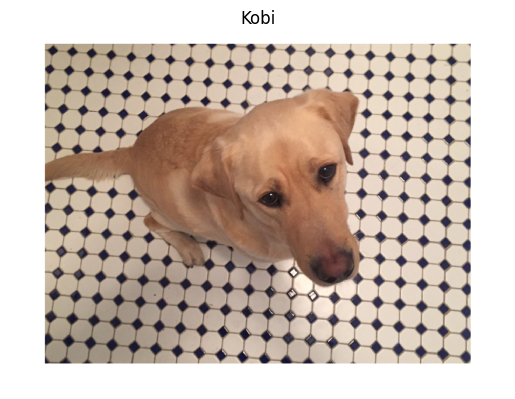

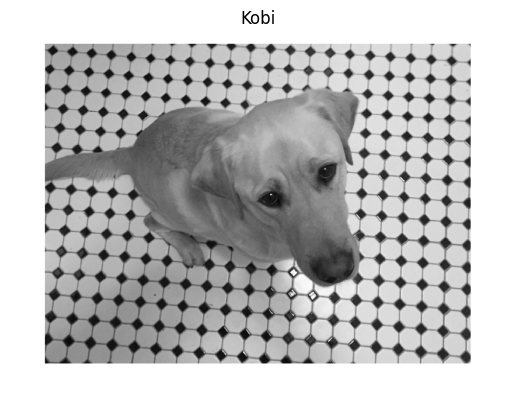

In [68]:
grayscale_image = preprocess_image(image_id="kobi")
show_image(grayscale_image)

The first image shows the original Kobi image.

The second image shows the image converted into a grayscale image.

In [73]:
def create_gabor_filter_bank(image):
    '''
    Create a Gabor filter bank with varying scales and orientations.

    Args:
        image: Grayscale input image

    Returns:
        gabor_filter_bank: A list of dictionaries containing Gabor filters and their parameters
    '''
    num_rows, num_cols = image.shape

    # Estimate the minimum and maximum wavelengths for the sinusoidal carriers
    lambda_min = 4 / np.sqrt(2)
    lambda_max = np.sqrt(np.abs(num_rows) ** 2 + np.abs(num_cols) ** 2)

    # Specify the carrier wavelengths
    n = np.floor(np.log2(lambda_max / lambda_min))
    lambdas = 2 ** np.arange(0, (n - 2) + 1) * lambda_min

    # Define the set of orientations for the Gaussian envelope (Thetas)
    delta_theta = np.pi / 4.0
    orientations = np.arange(0, np.pi + delta_theta, delta_theta)

    # Define the set of sigmas for the Gaussian envelope (spread of the Gaussian)
    sigmas = np.array([1, 2])

    gabor_filter_bank = []
    start_time = time.time()

    # Total number of features
    n_features = len(lambdas) * len(sigmas) * len(orientations)

    with tqdm(total=n_features) as pbar:

        # Generate Gabor filters for each combination of wavelength, sigma, and orientation
        for wavelength in lambdas:
            for sigma in sigmas:
                for theta in orientations:
                    # Filter parameter configuration
                    psi = 0
                    gamma = 0.5

                    # Create a Gabor filter with the specified parameters
                    filter_config = {}
                    filter_config["filter_pairs"] = create_gabor(sigma, theta, wavelength, psi, gamma)
                    filter_config["sigma"] = sigma
                    filter_config["wavelength"] = wavelength
                    filter_config["theta"] = theta
                    filter_config["psi"] = psi
                    filter_config["gamma"] = gamma

                    # Append the filter configuration to the filter bank
                    gabor_filter_bank.append(filter_config)

                    # Update the progress bar
                    pbar.update(1)

    creation_time = time.time() - start_time
    
    # Print details about the created filter bank
    print(f'Total number of filters: {len(gabor_filter_bank)}')
    print(f'Number of scales (sigma): {len(sigmas)}')
    print(f'Number of orientations (theta): {len(orientations)}')
    print(f'Number of carriers (lambda): {len(lambdas)}')
    print(f'\nFilter bank created in {creation_time} seconds.')

    return gabor_filter_bank

In [74]:
gabor_filter_bank = create_gabor_filter_bank(grayscale_image)

100%|██████████| 80/80 [00:00<00:00, 5357.65it/s]

Total number of filters: 80
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 8

Filter bank created in 0.05810689926147461 seconds.


In [75]:
### Foreground-Background segmentation algoritm
### Part 2 - gabor features fMaps and fMags

def extract_gabor_features(image, gabor_filter_bank, visualize=False):
    '''
    Filter images using the Gabor filter bank with quadrature pairs (real and imaginary parts).

    Args:
        image: Grayscale input image
        gabor_filter_bank: A list of dictionaries containing Gabor filters and their parameters
        visualize: Flag to visualize filter responses (default is False)

    Returns:
        feature_magnitudes: List of magnitude responses for each Gabor filter
    '''
    feature_maps = []

    with tqdm(total=len(gabor_filter_bank)) as pbar:

        for gabor_filter in gabor_filter_bank:
            # Filter the image with the real and imaginary parts of the Gabor filter

            real_output = None
            imaginary_output = None

            # YOUR CODE HERE
            real_filter = gabor_filter["filter_pairs"][:, :, 0]
            imaginary_filter = gabor_filter["filter_pairs"][:, :, 1]

            real_output = scipy.signal.convolve2d(image, real_filter, mode="same")
            imaginary_output = scipy.signal.convolve2d(image, imaginary_filter, mode="same")

            # Append the real and imaginary parts to the list of feature maps
            feature_maps.append(np.stack((real_output, imaginary_output), 2))

            # Update the progress bar
            pbar.update(1)

            # Visualize the filter responses if requested
            if visualize:
                fig = plt.figure()
                ax = fig.add_subplot(1, 2, 1)
                ax.imshow(real_output, cmap='gray')
                ax.set_title(f'Real Part, λ={gabor_filter["wavelength"]:.4f}, θ={gabor_filter["theta"]:.4f}, σ={gabor_filter["sigma"]:.4f}')
                ax.axis("off")

                ax = fig.add_subplot(1, 2, 2)
                ax.imshow(imaginary_output, cmap='gray')
                ax.set_title(f'Imaginary Part, λ={gabor_filter["wavelength"]:.4f}, θ={gabor_filter["theta"]:.4f}, σ={gabor_filter["sigma"]:.4f}')
                ax.axis("off")
                plt.show()

    # Compute the magnitude of the output responses
    feature_magnitudes = []

    with tqdm(total=len(feature_maps)) as pbar:
    
        for i, feature_map in enumerate(feature_maps):

            # Compute the magnitude of the feature map
            # YOUR CODE HERE
            magnitude = np.sqrt(feature_map[:, :, 0]**2 + feature_map[:, :, 1]**2)
            feature_magnitudes.append(magnitude)

            # Update the progress bar
            pbar.update(1)

            # Visualize the magnitude response if requested
            if visualize:
                plt.figure()
                plt.imshow(magnitude.astype(np.uint8), cmap='gray')
                plt.title(f'Magnitude, λ={gabor_filter_bank[i]["wavelength"]:.4f}, θ={gabor_filter_bank[i]["theta"]:.4f}, σ={gabor_filter_bank[i]["sigma"]:.4f}')
                plt.axis("off")
                plt.show()

    print(f'Created {len(feature_magnitudes)} features for each pixel')
    return feature_magnitudes

In [76]:
feature_magnitudes = extract_gabor_features(grayscale_image, gabor_filter_bank)

  0%|          | 0/80 [00:00<?, ?it/s]

100%|██████████| 80/80 [00:01<00:00, 44.07it/s]


Created 80 features for each pixel


In [77]:
### Foreground-Background segmentation algoritm
### Part 3 - cluster features in two sets

def cluster_features(image, feature_magnitudes, apply_smoothing=True):
    '''
    Cluster pixels based on their Gabor feature magnitudes.

    Hint: To standardize the features, you can use the following web page: https://www.analyticsvidhya.com/blog/2020/04/feature-scaling-machine-learning-normalization-standardization/

    Args:
        image: Grayscale input image
        feature_magnitudes: List of magnitude responses for each Gabor filter
        apply_smoothing: Flag to apply Gaussian smoothing (default is True)

    Returns:
        pixel_labels: Cluster labels for each pixel
    '''
    num_rows, num_cols = image.shape
    features = np.zeros(shape=(num_rows, num_cols, len(feature_magnitudes)))

    if apply_smoothing:
        # Apply Gaussian smoothing to each feature magnitude
        # YOUR CODE HERE
        for i, feature_magnitude in (enumerate(feature_magnitudes)):
            features[:, :, i] = cv2.GaussianBlur(image, (5, 5), 1)

    else:
        # Directly insert magnitude images into the features matrix
        for i, feature_magnitude in enumerate(feature_magnitudes):
            features[:, :, i] = feature_magnitude

    # Reshape the features matrix to prepare for clustering
    features = np.reshape(features, newshape=(num_rows * num_cols, -1))

    # Standardize the features   
    # YOUR CODE HERE
    features = (features - np.mean(features, axis=0) / np.std(features, axis=0))

    start_time = time.time()

    # Apply k-means clustering
    # YOUR CODE HERE
    kmeans = KMeans(n_clusters=2, random_state=42)
    pixel_labels = kmeans.fit_predict(features)

    print(f'Clustering completed in {time.time() - start_time} seconds.')

    return pixel_labels

In [78]:
pixel_labels = cluster_features(grayscale_image, feature_magnitudes, apply_smoothing=True)

Clustering completed in 1049.8283848762512 seconds.


In [79]:
### Foreground-Background segmentation algorithm
### Part 4 - Visualise result

def visualize_clustering_results(image, pixel_labels):
    '''
    Visualize the clustering results and segmentation.

    Args:
        image: Grayscale input image
        pixel_labels: Cluster labels for each pixel

    Returns:
        None
    '''
    num_rows, num_cols = image.shape
    pixel_labels = np.reshape(pixel_labels, newshape=(num_rows, num_cols))

    # Visualize pixel clusters
    plt.figure()
    plt.title('Pixel Clusters')
    plt.imshow(pixel_labels)
    plt.axis("off")
    plt.show()

    # Use pixel labels to visualize segmentation
    segmented_image1 = np.zeros_like(image)
    segmented_image2 = np.zeros_like(image)

    # YOUR CODE HERE
    binary_mask = pixel_labels == 2 # Check for the value of your labels in pixel_labels (could be 1 or 2 instead of 0)

    segmented_image1[binary_mask] = image[binary_mask]
    segmented_image2[~binary_mask] = image[~binary_mask]

    plt.figure()
    plt.title('Montage')
    plt.imshow(segmented_image1, cmap='gray', interpolation='none')
    plt.imshow(segmented_image2, cmap='jet', interpolation='none', alpha=0.7)
    plt.axis("off")
    plt.show()

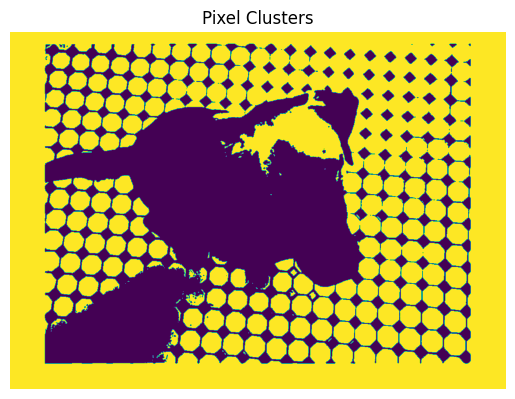

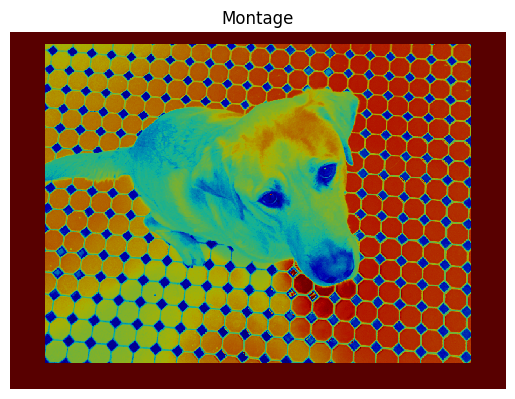

In [80]:
# Visualize the results
visualize_clustering_results(grayscale_image, pixel_labels)

The first image shows the result of pixel clustering using the KMeans algorithm. The purple region is one cluster (the object) and the yellow region is the other cluster (the background).

The second image shows the pixel cluster overlayed on top of the original image.

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (7 points)</font>

Implement the `foreground_background_separation()` function using Gabor filters. Complete the function provided and experiment with different images (`clownfish`, `flower`, `kobi`, `polar_bear_hiding`, `robin` **and** `swan`) using the default parameters.

Make sure to visualize the results using four subplots: the original image, the pixel representation projected onto the first principal component, the pixel clusters, and the montage showing segmentation. 

After visualizing the results, observe how the `sigmas` and `orientations` parameters influence the foreground-background separation. Describe your observations, focusing on the effectiveness of the separation and any patterns or trends you notice.

In [85]:
def foreground_background_separation(image, sigmas, orientations, apply_smoothing=True):
    '''
    Perform foreground-background segmentation using Gabor filters.

    Args:
        image: Grayscale input image
        sigmas: List of sigmas for the Gaussian envelope
        orientations: List of orientations for the Gabor filters
        apply_smoothing: Flag to apply Gaussian smoothing to magnitude images (default is True)

    Returns:
        None
    '''

    # Input checks types
    if image.ndim != 2:
        raise ValueError("Expected a grayscale image (H, W).")
    img = image.astype(np.float32)
    H, W = img.shape

    # Configure the filter bank
    globals()['sigmas'] = np.array(sigmas, dtype=np.float32)
    globals()['orientations'] = np.array(orientations, dtype=np.float32)

    gabor_filter_bank = create_gabor_filter_bank(img)

    # Extract Gabor magnitudes per filter
    feature_magnitudes = extract_gabor_features(img, gabor_filter_bank, visualize=False)

    # Cluster pixels into foreground/background
    pixel_labels = cluster_features(img, feature_magnitudes, apply_smoothing=apply_smoothing)  # shape (H*W,)

    # Compute "dominant component" map: max magnitude over the bank
    F = len(feature_magnitudes)
    mags_stack = np.stack(feature_magnitudes, axis=-1)  # (H, W, F)
    dominant_mag = np.max(mags_stack, axis=-1)          # (H, W)

    # Simple normalization for visualization
    dom = dominant_mag
    dmin, dmax = float(dom.min()), float(dom.max())
    if dmax > dmin:
        dom_vis = (dom - dmin) / (dmax - dmin)
    else:
        dom_vis = np.zeros_like(dom)

    # Reshape labels to image grid for display
    labels_2d = np.reshape(pixel_labels, (H, W))

    # Build montage for the 4th subplot
    mean0 = img[labels_2d == 0].mean() if np.any(labels_2d == 0) else -np.inf
    mean1 = img[labels_2d == 1].mean() if np.any(labels_2d == 1) else -np.inf
    fg_label = 1 if mean1 > mean0 else 0
    fg_mask = (labels_2d == fg_label)

    seg_fg = np.zeros_like(img)
    seg_bg = np.zeros_like(img)
    seg_fg[fg_mask] = img[fg_mask]
    seg_bg[~fg_mask] = img[~fg_mask]

    # Four-panel visualization
    fig, axes = plt.subplots(2, 2, figsize=(12, 9))
    fig.suptitle("Foreground–Background Separation via Gabor Features", y=0.98)

    # Original image
    axes[0, 0].imshow(img, cmap='gray')
    axes[0, 0].set_title("Original")
    axes[0, 0].axis("off")

    # Dominant Gabor magnitude
    axes[0, 1].imshow(dom_vis, cmap='gray')
    axes[0, 1].set_title("Dominant Gabor Component (max magnitude)")
    axes[0, 1].axis("off")

    # Pixel clusters
    axes[1, 0].imshow(labels_2d, cmap='viridis', interpolation='nearest')
    axes[1, 0].set_title("Pixel Clusters (K=2)")
    axes[1, 0].axis("off")

    # Montage: foreground (gray) + background (jet overlay)
    axes[1, 1].imshow(seg_fg, cmap='gray', interpolation='none')
    axes[1, 1].imshow(seg_bg, cmap='jet', interpolation='none', alpha=0.65)
    axes[1, 1].set_title("Montage (Foreground + Background)")
    axes[1, 1].axis("off")

    plt.tight_layout()
    plt.show()

    return pixel_labels

100%|██████████| 70/70 [00:00<00:00, 4788.96it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.026531219482421875 seconds.


100%|██████████| 70/70 [00:00<00:00, 280.58it/s]


Created 70 features for each pixel
Clustering completed in 0.4848809242248535 seconds.


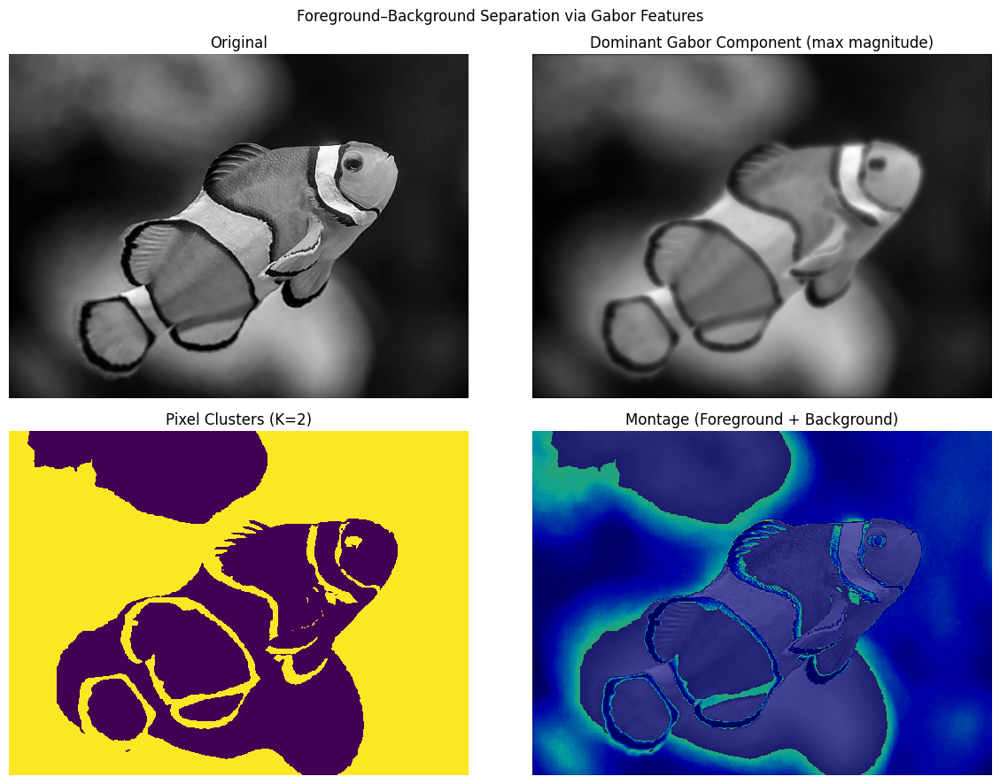

100%|██████████| 70/70 [00:00<00:00, 12773.60it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.007222890853881836 seconds.


100%|██████████| 70/70 [00:00<00:00, 381.49it/s]


Created 70 features for each pixel
Clustering completed in 0.41423726081848145 seconds.


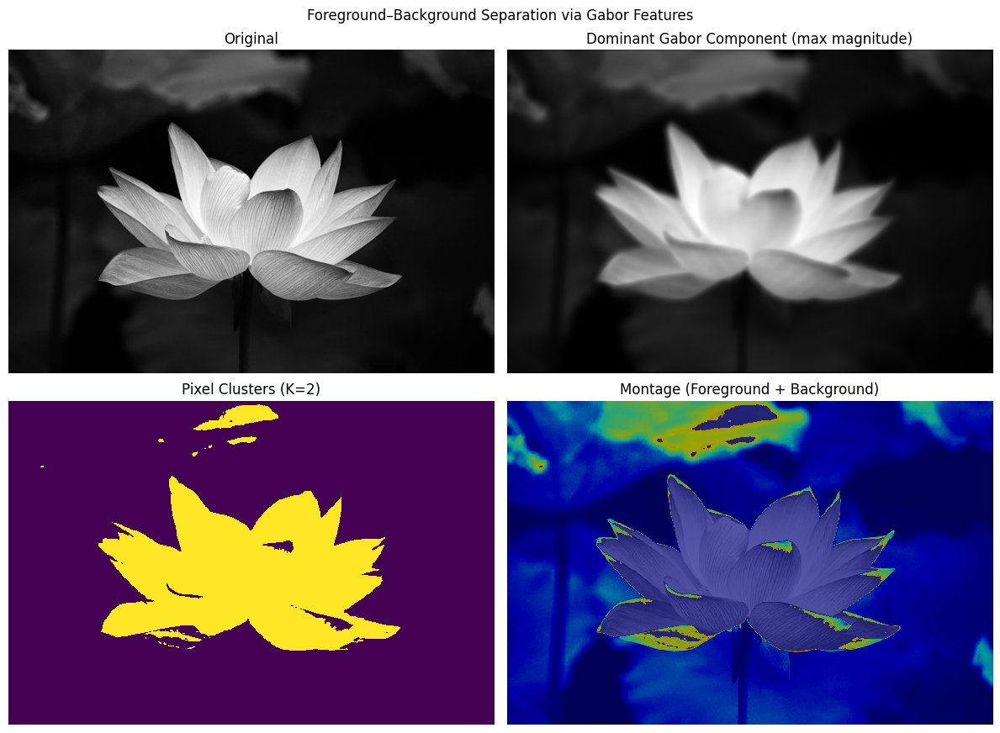

100%|██████████| 80/80 [00:00<00:00, 14265.73it/s]


Total number of filters: 80
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 8

Filter bank created in 0.00790715217590332 seconds.


100%|██████████| 80/80 [00:03<00:00, 26.13it/s]


Created 80 features for each pixel
Clustering completed in 1.8456840515136719 seconds.


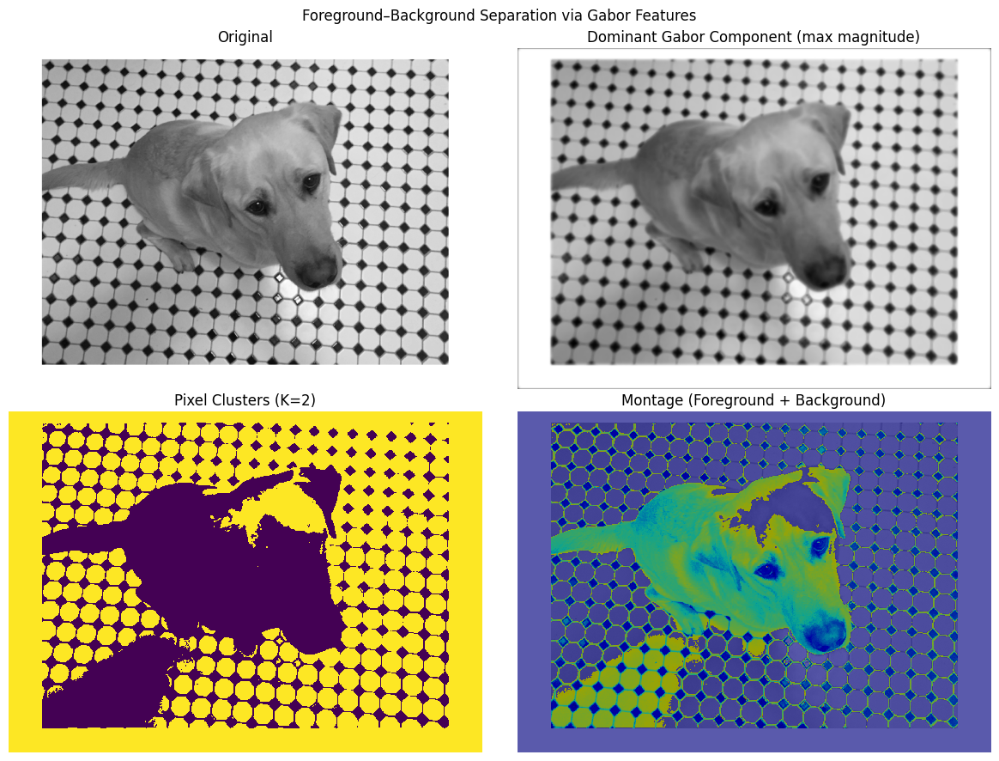

100%|██████████| 60/60 [00:00<00:00, 15029.76it/s]


Total number of filters: 60
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 6

Filter bank created in 0.005187034606933594 seconds.


100%|██████████| 60/60 [00:00<00:00, 3825.52it/s]


Created 60 features for each pixel
Clustering completed in 0.3072168827056885 seconds.


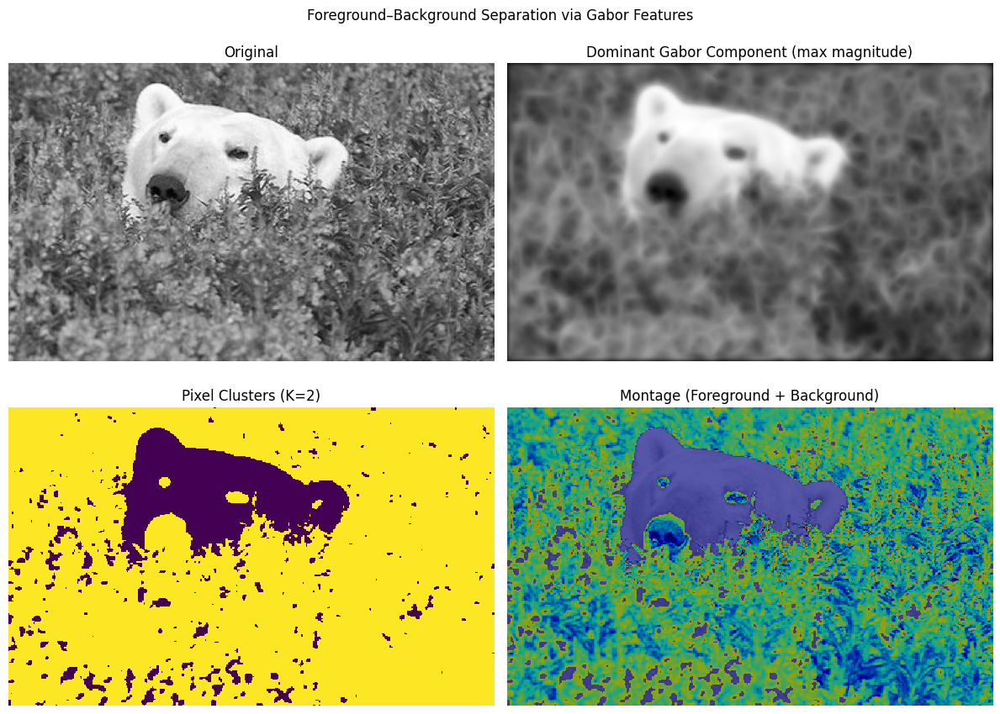

100%|██████████| 70/70 [00:00<00:00, 16884.31it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.0054168701171875 seconds.


100%|██████████| 70/70 [00:00<00:00, 168.33it/s]


Created 70 features for each pixel
Clustering completed in 0.9459819793701172 seconds.


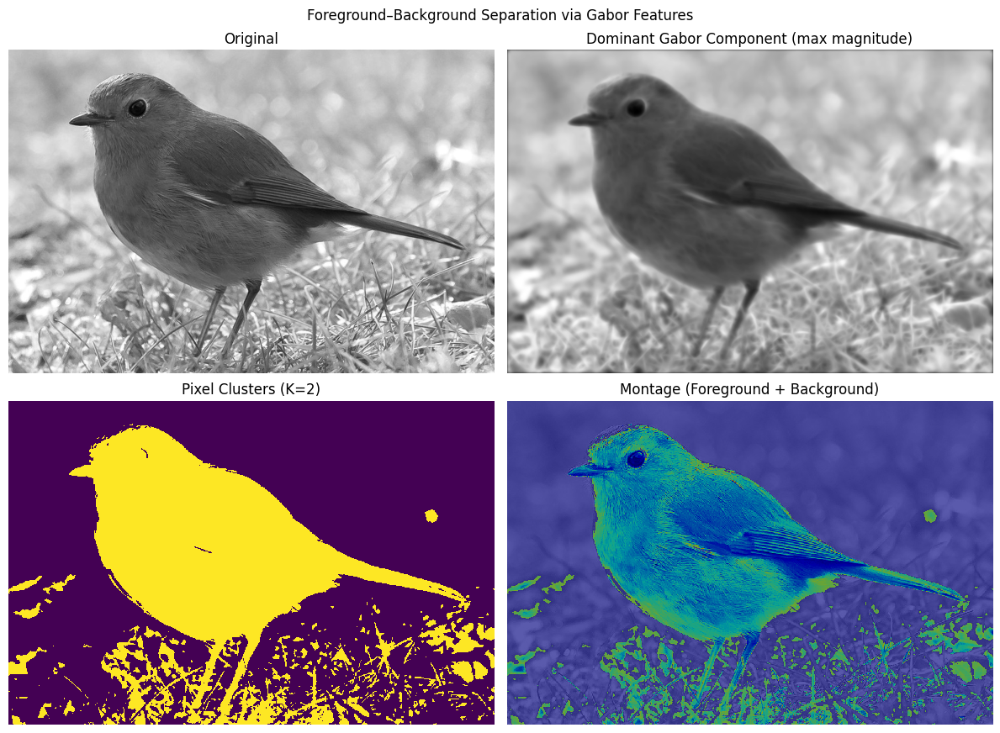

100%|██████████| 70/70 [00:00<00:00, 16469.47it/s]


Total number of filters: 70
Number of scales (sigma): 2
Number of orientations (theta): 5
Number of carriers (lambda): 7

Filter bank created in 0.005227088928222656 seconds.


100%|██████████| 70/70 [00:00<00:00, 193.39it/s]


Created 70 features for each pixel
Clustering completed in 0.7206530570983887 seconds.


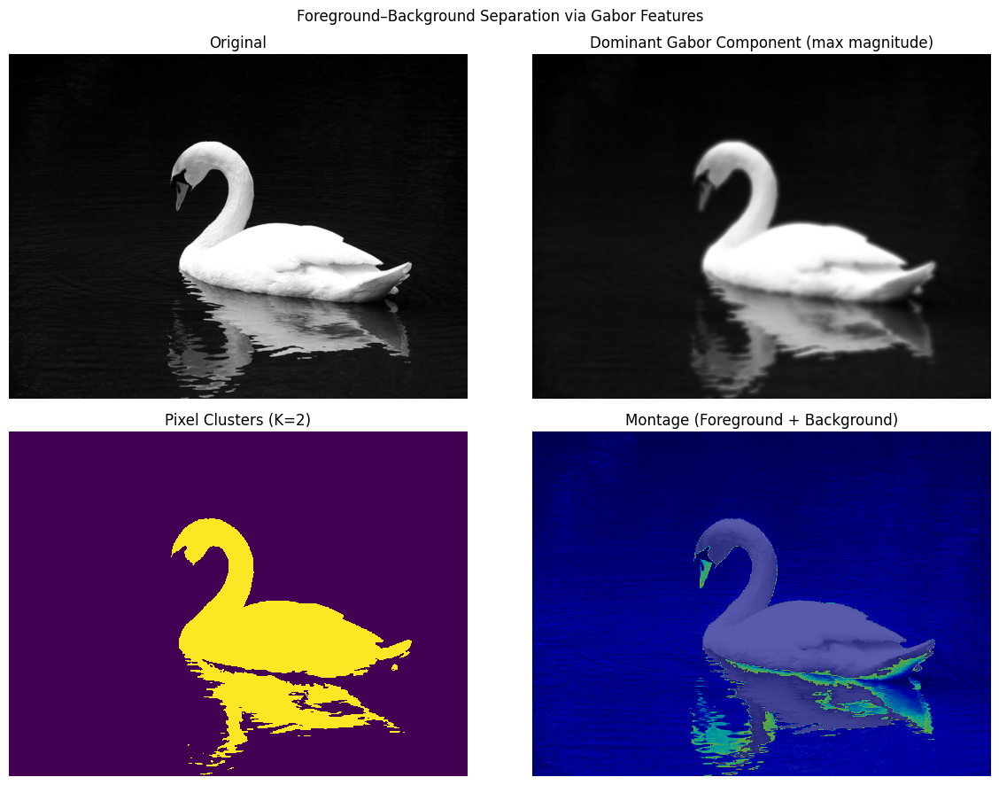

In [86]:
# Control settings
delta_theta = 2 * np.pi / 8  # Step size for orientations
orientations = np.arange(0, np.pi + delta_theta, delta_theta)
sigmas = np.array([1.0, 2.0])
apply_smoothing = True

image_names = [
    "clownfish",
    "flower",
    "kobi",
    "polar_bear_hiding",
    "robin",
    "swan"
]

# Loop through each image, load it, and apply foreground-background separation
for image_name in image_names:
    # Load the image
    image = load_image(image_name)
    
    # Convert the image to grayscale
    image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # Perform foreground-background separation
    foreground_background_separation(image, sigmas, orientations, apply_smoothing)

##### <font color='yellow'>Answer:</font>

> Effect of orientations ($\theta$): Increasing the number of orientations allows the Gabor filter bank to capture edges and textures aligned in many different directions. This is especially useful in images with structured backgrounds, such as tiled floors, grass, or ripples on water. With 5 orientations, the filters respond to horizontal, vertical, and diagonal textures, which makes the background stand out clearly. However, if too few orientations are used, edges that fall between the sampled directions may be missed, reducing the effectiveness of the separation.

> Effect of scales ($\sigma$): The parameter $\sigma$ controls the spatial scale of the Gabor filters. Small sigma values capture fine details such as grass blades, feather textures, or tile patterns. These help to distinguish highly textured backgrounds from smoother foreground objects, but may also introduce noise and speckle in the segmentation. Larger sigma values respond to coarser structures and are more effective at capturing the broad shape of smooth objects (e.g., swan, clownfish body) while suppressing small background details. This leads to cleaner masks for smooth foregrounds.

> Images with strong background texture (tiles, grass) are best separated when multiple orientations and small sigma are included. Smooth objects against smoother backgrounds benefit more from larger sigma, which suppresses background noise. The main failure case occurs when both background and foreground contain fine, multi-orientation textures, leading to speckled cluster assignments. This can be mitigated by applying smoothing or emphasizing coarse scales.

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (4 points)</font>

Experiment with different `sigma` and `theta` settings for the `foreground_background_separation()` function until you achieve reasonable outputs. For each input image, report the parameter settings that work best and provide an explanation for why these settings are effective. 

##### <font color='yellow'>Answer:</font>

> *Write your answer here.*

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

After achieving decent separation on all test images, run the script again using the corresponding parameters, but this time set `apply_smoothing = False`. 

Describe what you observe in the output when smoothing is not applied to the magnitude images. Explain why these changes occur and discuss the reasoning behind the smoothing step.

In [ ]:
# YOUR CODE HERE

##### <font color='yellow'>Answer:</font>

> *Write your answer here.*

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
|  | - % | - % | - % |
|  | - % | - % | - % |
|  | - % | - % | - % |
|  | - % | - % | - % |

### - End of Notebook -